# Machine Learning Project - Visualization part
## 2024/2025 - Group 16
Sarah Leuthner, 20240581 </br>
Bárbara Capitão, 20211532 </br>
Ricardo Kayseller, 20230450 </br>
Ludovica Collé, 20241449 </br>
Elisa Pacheco, 20240600 </br>

# **Index**
This notebook will concentrate on data understanding and visualization
1. [Import Libaries](#imports) </br>
</br>
2. [Data Understanding](#dataunderstanding) </br>
2.1 [Data Exploration](#dataexploration) </br>
2.2 [Checking incoherences](#incoherences)</br>
2.3 [Visualizations](#visuals) </br>
2.3.1 [Numeric Features](#numerics) </br>
2.3.2 [Categorical Features](#categoricals) </br>
2.3.3 [Datatime Features](#dates)</br>
2.3.3 [Targets](#targets) </br>

<a class="anchor" id="imports">
    
## 1. Import Libaries

</a>

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np 
import os
import missingno as msno
from scipy import stats

#Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil

#To get plots with better resolution 
%config InlineBackend.figure_format = 'retina'

import sqlite3

from sklearn import datasets
import math
from itertools import product
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
from datetime import datetime

sns.set()

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.lines import Line2D
from matplotlib import __version__ as mplver

#Outlier and noise filtering
from collections import Counter


In [5]:
#import the csv file to the notebook
#data_set = pd.read_csv(r"C:\Users\Bárbara C\Desktop\Mestrado\Machine lerninig\project_data\train_data.csv")
#data_set = pd.read_csv('/Users/ricardokayseller/Desktop/Group work ML/project_data/train_data.csv')
data_set = pd.read_csv("train_data.csv")

In [6]:
# test_set = pd.read_csv(r"C:\Users\Bárbara C\Desktop\Mestrado\Machine lerninig\project_data\test_data.csv")
test_set = pd.read_csv("test_data.csv")
test = test_set.copy()


In [7]:
test.head(5)

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,Medical Fee Region,OIICS Nature of Injury Description,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Number of Dependents
0,2022-12-24,19,N,2023-01-02,N,NaN,2003.0,2023-01-02,NaN,INDEMNITY INSURANCE CO OF,...,IV,NaN,31.0,"FALL, SLIP OR TRIP, NOC",10.0,CONTUSION,54.0,LOWER LEG,10466,1
1,2022-11-20,19,N,2023-01-02,N,NaN,2003.0,2023-01-02,NaN,A I U INSURANCE COMPANY,...,IV,NaN,75.0,FALLING OR FLYING OBJECT,10.0,CONTUSION,10.0,MULTIPLE HEAD INJURY,11691,1
2,2022-12-26,59,N,2023-01-02,N,0.0,1963.0,2022-12-31,NaN,AMGUARD INSURANCE COMPANY,...,III,NaN,68.0,STATIONARY OBJECT,49.0,SPRAIN OR TEAR,62.0,BUTTOCKS,10604,0
3,2022-12-28,55,N,2023-01-02,N,0.0,0.0,2023-01-02,NaN,INDEMNITY INS. OF N AMERICA,...,IV,NaN,25.0,FROM DIFFERENT LEVEL (ELEVATION),10.0,CONTUSION,53.0,KNEE,11411,6
4,2022-12-20,25,N,2023-01-02,N,0.0,1997.0,2022-12-31,NaN,NEW HAMPSHIRE INSURANCE CO,...,IV,NaN,79.0,OBJECT BEING LIFTED OR HANDLED,40.0,LACERATION,37.0,THUMB,11212,5


In [8]:
df = data_set.copy()

In [9]:
# Find the duplicate Claim Identifier values
duplicate_ids = df['Claim Identifier'][df['Claim Identifier'].duplicated()]

# Display the actual duplicate Claim Identifiers
print("Duplicate Claim Identifiers:")
for claim_id in duplicate_ids.unique():
    print(claim_id)

# Filter the DataFrame to show all rows with these duplicate Claim Identifiers
duplicates = df[df['Claim Identifier'].duplicated(keep=False)]

# Sort the result by 'Claim Identifier' for easier visualization
duplicates_sorted = duplicates.sort_values(by='Claim Identifier')

# Display the duplicate records
print("\nRecords with duplicate Claim Identifiers:")
duplicates


Duplicate Claim Identifiers:
292668076

Records with duplicate Claim Identifiers:


,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
257901,NaN,NaN,NaN,2021-05-21,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
526445,NaN,NaN,NaN,2022-09-05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


as we can see the Claim Identifier 292668076 is duplicated and the rows are not equal 'Assembly date' is different in both records so the best approach is to remove both rows.


In [11]:
# Identify all duplicate 'Claim Identifier' values
duplicate_ids = df['Claim Identifier'][df['Claim Identifier'].duplicated(keep=False)]

# Remove all rows with duplicate 'Claim Identifier' values
df = df[~df['Claim Identifier'].isin(duplicate_ids)]

__Set variable 'Claim Identifier' as index__
<br>Claim Identifier was selected as the index because it uniquely identifies each record, ensuring data integrity and facilitating efficient lookups.

In [13]:
#Set the index
df = df.set_index('Claim Identifier')
df = df.sort_index()

In [14]:
df.head(5)

,Accident Date,Age at Injury,Alternative Dispute Resolution,Assembly Date,Attorney/Representative,Average Weekly Wage,Birth Year,C-2 Date,C-3 Date,Carrier Name,...,WCIO Cause of Injury Code,WCIO Cause of Injury Description,WCIO Nature of Injury Code,WCIO Nature of Injury Description,WCIO Part Of Body Code,WCIO Part Of Body Description,Zip Code,Agreement Reached,WCB Decision,Number of Dependents
Claim Identifier,,,,,,,,,,,,,,,,,,,,,
5393066,2019-09-17,64.0,N,2020-01-01,N,1345.97,1954.0,2020-01-01,NaN,HARTFORD FIRE INSURANCE CO,...,97.0,REPETITIVE MOTION,46.0,RUPTURE,38.0,SHOULDER(S),NaN,1.0,Not Work Related,1.0
5393091,2019-08-30,46.0,N,2020-01-01,Y,1745.93,1973.0,2020-01-01,2020-01-14,ZURICH AMERICAN INSURANCE CO,...,97.0,REPETITIVE MOTION,49.0,SPRAIN OR TEAR,38.0,SHOULDER(S),14569,1.0,Not Work Related,4.0
5393667,2019-12-23,54.0,N,2020-01-01,N,0.00,1965.0,2020-01-01,NaN,"DELHAIZE AMERICA, LLC",...,30.0,"SLIP, OR TRIP, DID NOT FALL",10.0,CONTUSION,55.0,ANKLE,12189,0.0,Not Work Related,3.0
5393769,2019-11-14,56.0,N,2020-01-02,N,0.00,0.0,NaN,NaN,SAFETY NATIONAL CASUALTY CORP,...,NaN,NaN,NaN,NaN,NaN,NaN,18426,0.0,Not Work Related,6.0
5393770,2019-12-31,26.0,N,2020-01-02,N,0.00,1993.0,2020-01-02,2019-12-31,STATE INSURANCE FUND,...,12.0,OBJECT HANDLED,10.0,CONTUSION,36.0,FINGER(S),13202,0.0,Not Work Related,5.0


<a class="anchor" id="dataunderstanding">
    
## 2. Data Unterstanding

</a>

<a class="anchor" id="dataexploration">
    
### 2.1 Data Exploration

</a>

In [17]:
#check the dimensions of dataframe
df.shape

(593469, 32)

In [18]:
test.shape

(387975, 30)

In [19]:
#check the columns in dataframe
df.columns

Index(['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
       'Assembly Date', 'Attorney/Representative', 'Average Weekly Wage',
       'Birth Year', 'C-2 Date', 'C-3 Date', 'Carrier Name', 'Carrier Type',
       'Claim Injury Type', 'County of Injury', 'COVID-19 Indicator',
       'District Name', 'First Hearing Date', 'Gender', 'IME-4 Count',
       'Industry Code', 'Industry Code Description', 'Medical Fee Region',
       'OIICS Nature of Injury Description', 'WCIO Cause of Injury Code',
       'WCIO Cause of Injury Description', 'WCIO Nature of Injury Code',
       'WCIO Nature of Injury Description', 'WCIO Part Of Body Code',
       'WCIO Part Of Body Description', 'Zip Code', 'Agreement Reached',
       'WCB Decision', 'Number of Dependents'],
      dtype='object')

In [20]:
test.columns

Index(['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
       'Assembly Date', 'Attorney/Representative', 'Average Weekly Wage',
       'Birth Year', 'C-2 Date', 'C-3 Date', 'Carrier Name', 'Carrier Type',
       'Claim Identifier', 'County of Injury', 'COVID-19 Indicator',
       'District Name', 'First Hearing Date', 'Gender', 'IME-4 Count',
       'Industry Code', 'Industry Code Description', 'Medical Fee Region',
       'OIICS Nature of Injury Description', 'WCIO Cause of Injury Code',
       'WCIO Cause of Injury Description', 'WCIO Nature of Injury Code',
       'WCIO Nature of Injury Description', 'WCIO Part Of Body Code',
       'WCIO Part Of Body Description', 'Zip Code', 'Number of Dependents'],
      dtype='object')

We can see that we have different number of columns from train to test data set. In test we don't have the fetaure "Agreement Reached" and "Claim Injury type" that is our target variable, so it's right to do not having it in the test.

In [22]:
#check the data type of each column and evidence of missing values among many variables
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 593469 entries, 5393066 to 999891667
Data columns (total 32 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   Accident Date                       570337 non-null  object 
 1   Age at Injury                       574026 non-null  float64
 2   Alternative Dispute Resolution      574026 non-null  object 
 3   Assembly Date                       593469 non-null  object 
 4   Attorney/Representative             574026 non-null  object 
 5   Average Weekly Wage                 545375 non-null  float64
 6   Birth Year                          544948 non-null  float64
 7   C-2 Date                            559466 non-null  object 
 8   C-3 Date                            187245 non-null  object 
 9   Carrier Name                        574026 non-null  object 
 10  Carrier Type                        574026 non-null  object 
 11  Claim Injury Type     

**Notes on the DataFrame Information:**
* Dates are objects 
* Floats can be changed integers (expect maybe for "Average Weekly Wage")
* Check to see, if "Average Weekly Wage" needs to be a float 
* "Agreement Reached" = according to metadata is boolean
* Explore ways to simplify "Carrier Type", "Claim Injury Type" and "Medical Fee Region", for better handling? -> change into integers
* Description features can be dropped: OIICS Nature of Injury Description (no data), WCIO Cause of Injury Description, WCIO Nature of Injury Description, WCIO Part Of Body Description (Decription only needed for interpretation, no different value than the codes) </br>
</br>
* Most columns have object values
* There are missing values in most of the columns
* "OIICS Nature of Injury Description" can be droppped -> no values

Covert the date to the datatime type, to can get and make readable the values of this variables

In [25]:
#convert the accident date to the type of datatime to get all the values of this variable
df['Accident Date'] = pd.to_datetime(df['Accident Date'], errors='coerce')
df['First Hearing Date'] = pd.to_datetime(df['First Hearing Date'], errors='coerce')
df['Assembly Date'] = pd.to_datetime(df['Assembly Date'], errors='coerce')

df['C-2 Date'] = pd.to_datetime(df['C-2 Date'])
df['C-3 Date'] = pd.to_datetime(df['C-3 Date'])

In [26]:
#convert the accident date to the type of datatime to get all the values of this variable
test['Accident Date'] = pd.to_datetime(test['Accident Date'], errors='coerce')
test['First Hearing Date'] = pd.to_datetime(test['First Hearing Date'], errors='coerce')
test['Assembly Date'] = pd.to_datetime(test['Assembly Date'], errors='coerce')

test['C-2 Date'] = pd.to_datetime(test['C-2 Date'])
test['C-3 Date'] = pd.to_datetime(test['C-3 Date'])

In [27]:
#check the central tendency measures
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Accident Date,570337,2021-04-28 21:00:27.892982528,1961-09-06 00:00:00,2020-09-14 00:00:00,2021-06-27 00:00:00,2022-03-21 00:00:00,2023-09-29 00:00:00,NaN
Age at Injury,574026.0,42.11427,0.0,31.0,42.0,54.0,117.0,14.256432
Assembly Date,593469,2021-07-19 03:24:46.765442816,2020-01-01 00:00:00,2020-10-26 00:00:00,2021-07-29 00:00:00,2022-04-19 00:00:00,2022-12-31 00:00:00,NaN
Average Weekly Wage,545375.0,491.088321,0.0,0.0,0.0,841.0,2828079.0,6092.91812
Birth Year,544948.0,1886.767604,0.0,1965.0,1977.0,1989.0,2018.0,414.644423
C-2 Date,559466,2021-07-16 20:11:19.865442816,1996-01-12 00:00:00,2020-11-06 00:00:00,2021-08-09 00:00:00,2022-04-26 00:00:00,2024-06-01 00:00:00,NaN
C-3 Date,187245,2021-07-26 21:31:28.449892608,1992-11-13 00:00:00,2020-10-27 00:00:00,2021-07-21 00:00:00,2022-04-20 00:00:00,2024-05-31 00:00:00,NaN
First Hearing Date,150798,2022-03-19 05:07:38.218279168,2020-01-30 00:00:00,2021-06-01 00:00:00,2022-03-09 00:00:00,2023-01-11 00:00:00,2024-06-07 00:00:00,NaN
IME-4 Count,132803.0,3.207337,1.0,1.0,2.0,4.0,73.0,2.832303
Industry Code,564068.0,58.645305,11.0,45.0,61.0,71.0,92.0,19.644175


In [28]:
#check the central tendency measures
df.describe(include="O").T

,count,unique,top,freq
Alternative Dispute Resolution,574026,3,N,571412
Attorney/Representative,574026,2,N,392291
Carrier Name,574026,2046,STATE INSURANCE FUND,111144
Carrier Type,574026,8,1A. PRIVATE,285368
Claim Injury Type,574026,8,2. NON-COMP,291078
County of Injury,574026,63,SUFFOLK,60430
COVID-19 Indicator,574026,2,N,546505
District Name,574026,8,NYC,270779
Gender,574026,4,M,335218
Industry Code Description,564068,20,HEALTH CARE AND SOCIAL ASSISTANCE,114339


__Key Observations:__

1. **Accident Date**:
   - **Count**: 570,337 entries.
   - **Unique Values**: 5,539 different accident dates, with the most frequent being March 1, 2020.
   - **Relevance**: Dates are well-represented with many unique values, indicating a broad range of accidents over time.

2. **Age at Injury**:
   - **Mean Age**: 42.1 years, with a standard deviation of 14.26, showing variability in the age of injured workers.
   - **Min/Max Age**: 0 years (likely erroneous) to 117 years, indicating potential data quality issues.
   - **Relevance**: Age distribution seems reasonable, but some data cleaning (e.g., unrealistic ages) might be needed.

3. **Alternative Dispute Resolution**:
   - **Most Common Value**: "No" (N), representing 571,412 cases, showing that ADR is rarely used.
   - **Relevance**: This suggests that most cases do not involve alternative resolution mechanisms.

4. **Attorney/Representative**:
   - **Most Common Value**: "No" (N), with 392,291 cases, indicating that most workers do not have legal representation.
   - **Relevance**: This may reflect the accessibility of legal resources for workers or the nature of claims.

5. **Average Weekly Wage**:
   - **Mean**: $491.09, with a very high standard deviation ($6,092), indicating outliers and wage variability.
   - **Relevance**: The wide range, from $0 to over $2.8 million, suggests outliers or extreme cases that may need further investigation.

6. **Birth Year**:
   - **Mean**: 1886 (clearly an error), with a large standard deviation.
   - **Relevance**: This column has significant data quality issues and should be cleaned (many birth years are unrealistic).

7. **Carrier Name**:
   - **Most Common Carrier**: "State Insurance Fund" with 111,144 entries.
   - **Relevance**: This suggests that this insurance carrier is prominent, possibly reflecting government-backed insurance.

8. **COVID-19 Indicator**:
   - **Most Common Value**: "No" (N), indicating that most cases are not related to COVID-19.
   - **Relevance**: This dataset covers a broad time range, with few cases related to the pandemic.

9. **Gender**:
   - **Most Common Value**: Male (335,218 entries), showing a gender imbalance in the dataset.
   - **Relevance**: Gender differences could be relevant for understanding the demographic distribution of injuries.

10. **Industry Code Description**:
    - **Most Common Industry**: "Health Care and Social Assistance" with 114,339 entries.
    - **Relevance**: This suggests that this industry is heavily represented, which could be significant for occupational health studies.

11. **Zip Code**:
    - **Mean Zip Code**: 12,500, but with a wide range (min = 0, max = 99,999), suggesting some invalid data.
    - **Relevance**: Location data could be useful, but some zip codes may need to be cleaned (e.g., zero or very high values).

12. **WCB Decision**:
    - **Most Common Value**: "Not Work Related" for all 574,026 entries.
    - **Relevance**: This indicates that this dataset is filtered for non-work-related cases, which is an important context for any analysis.

13. **Number of Dependents**:
    - **Mean**: 3 dependents, with a max of 6.
    - **Relevance**: Understanding the family context of injured workers can be important for claims analysis.

__Final Notes:__
- **Data Quality**: Some columns, such as "Birth Year" and "Average Weekly Wage," show extreme or incorrect values, indicating the need for data cleaning before further analysis.
- **Wage Variability**: The wide range in wages (from $0 to over $2.8 million) suggests significant disparities, possibly due to outliers or varying types of claims.
- **Demographic Insights**: The dataset covers a broad demographic, but there is a gender imbalance (more males), and certain industries (e.g., health care) are heavily represented.
- **Filtered Data**: The "WCB Decision" column shows that all cases are "Not Work Related," meaning the dataset is focused on non-occupational claims.
- Injury occure mostly for people older than 31 years, with the majority between 31 and 54 years. The minimum of 0 years implicates missing data, the maximum age of 117 years could be false data or an extreme outlier
- The minimum year in Birth Year it's 0 this is an error
- The maxium value in Average Weekly Wage it's very high could be a false data or an extreme outlier if we check the minimun and the other stastistics about this variable
- We don't have any information about OIICS Nature of Injury Description
- In WCIO Part Of Body Code the minimum value is negative could be false data or an input error

<a class="anchor" id="incoherences">
    
### 2.2. Checking incoherences

</a>

In [32]:
# check for rows where COVID-19 Indicator is "Y" and Accident Date is before 2020
pre_pandemic_covid_cases = df[(df['COVID-19 Indicator'] == 'Y') & (df['Accident Date'] < '2020-01-01')]

pre_pandemic_covid_cases = pre_pandemic_covid_cases[['Accident Date','COVID-19 Indicator']]

pre_pandemic_covid_cases


,Accident Date,COVID-19 Indicator
Claim Identifier,,
5401736,2019-12-17,Y
5642885,2019-12-22,Y


>It is not an inconsistency because these cases are from December 2019, when COVID-19 began

In [34]:
#Age at Injury diferent from Accident Year−Birth Year

df_f = df.copy()
df_f['Birth Year'] = df['Birth Year'].replace([0.0], np.nan)
df_f['Age at Injury'] = df['Age at Injury'].replace([0.0], np.nan)

# check rows where the difference between calculated and provided Age at Injury is more than 1
filtered_df = df_f[abs(df_f['Age at Injury'] - (df_f['Accident Date'].dt.year - df_f['Birth Year'])) > 1]

filtered_df = filtered_df[['Accident Date', 'Birth Year', 'Age at Injury']]
print(filtered_df)


Empty DataFrame
Columns: [Accident Date, Birth Year, Age at Injury]
Index: []


> Here, we aimed to determine if the age at injury differed from the calculation of the accident date minus the birth year. As we can observe, when substituting the 0 values in age and birth year with NaN, this discrepancy does not appear in the dataset. 

In [36]:
#Check if theres very young workers with unusually high Average Weekly Wage.

high_wage_threshold = 2000

young_high_wage_cases = df_f[(df_f['Age at Injury'] < 18) & (df['Average Weekly Wage'] > high_wage_threshold)]

young_high_wage_cases = young_high_wage_cases[['Age at Injury', 'Average Weekly Wage']]
young_high_wage_cases


,Age at Injury,Average Weekly Wage
Claim Identifier,,
5579602,17.0,2026.65


In [37]:
# Check for rows where First Hearing Date is before Assembly Date

filtered_df = df[
    (df['Assembly Date'] > df['First Hearing Date'])
]

filtered_df = filtered_df[['Accident Date', 'C-2 Date', 'C-3 Date', 'Assembly Date', 'First Hearing Date']]

filtered_df

,Accident Date,C-2 Date,C-3 Date,Assembly Date,First Hearing Date
Claim Identifier,,,,,


In [38]:
# Check for rows where First Hearing Date is before Assembly Date

filtered_df = df[
    (df['Assembly Date'] == df['C-2 Date'])
]

filtered_df = filtered_df[['Accident Date', 'C-2 Date', 'C-3 Date', 'Assembly Date', 'First Hearing Date']]

filtered_df

,Accident Date,C-2 Date,C-3 Date,Assembly Date,First Hearing Date
Claim Identifier,,,,,
5393066,2019-09-17,2020-01-01,NaT,2020-01-01,NaT
5393091,2019-08-30,2020-01-01,2020-01-14,2020-01-01,2020-02-21
5393667,2019-12-23,2020-01-01,NaT,2020-01-01,NaT
5393770,2019-12-31,2020-01-02,2019-12-31,2020-01-02,NaT
5393772,2019-12-13,2020-01-02,2020-05-12,2020-01-02,NaT
...,...,...,...,...,...
6165680,2022-12-19,2022-12-30,2023-03-06,2022-12-30,2024-04-09
6165681,2022-11-14,2022-12-30,NaT,2022-12-30,NaT
6165683,2022-11-19,2022-12-30,NaT,2022-12-30,NaT


In [39]:
# Check for rows where Accident Date is after C-2 Date, C-3 Date, Assembly Date, or First Hearing Date 

filtered_df = df[
    (df['Accident Date'] > df['C-2 Date']) | 
    (df['Accident Date'] > df['C-3 Date']) | 
    (df['Accident Date'] > df['Assembly Date']) | 
    (df['Accident Date'] > df['First Hearing Date'])
]

filtered_df = filtered_df[['Accident Date', 'C-2 Date', 'C-3 Date', 'Assembly Date', 'First Hearing Date']]

filtered_df

,Accident Date,C-2 Date,C-3 Date,Assembly Date,First Hearing Date
Claim Identifier,,,,,
5393820,2020-01-02,2020-06-05,2019-12-26,2020-01-02,2020-07-08
5393830,2020-03-01,2020-01-17,2019-12-27,2020-01-02,2020-08-28
5393953,2020-02-26,2019-12-31,2020-01-31,2020-01-01,2020-05-04
5394099,2020-01-23,2020-01-14,2019-12-27,2020-01-02,2020-06-05
5394146,2020-01-02,2020-02-11,2019-12-26,2020-01-02,2020-03-09
...,...,...,...,...,...
6162010,2023-02-02,2022-12-26,NaT,2022-12-26,2023-11-16
6162263,2022-12-28,2022-12-26,NaT,2022-12-26,NaT
6162694,2022-12-19,2022-12-27,2022-12-14,2022-12-27,2023-12-01


In [40]:
# Check the ages
age_bins = [-1, 0, 10, 18, 25, 30, 40, 50, 60, 70, 80, 90, 100, 120]  # Age range boundaries
age_labels = ["0", "1-9", "10-18", "18-25", "25-30", "30-40", "40-50", "50-60", "60-70", "70-80", "80-90", "90-100", "100+"]  # Labels for each age range

age_category_counts = pd.cut(df['Age at Injury'], bins=age_bins, labels=age_labels)

age_category_counts_sorted = age_category_counts.value_counts().sort_index()

print(age_category_counts_sorted)

Age at Injury
0           5464
1-9           20
10-18       5676
18-25      64265
25-30      65604
30-40     129612
40-50     118033
50-60     127283
60-70      51167
70-80       6111
80-90        625
90-100       112
100+          54
Name: count, dtype: int64


>It doesn’t make sense to have so many injured children listed as 0 years old; these entries should be treated as missing values

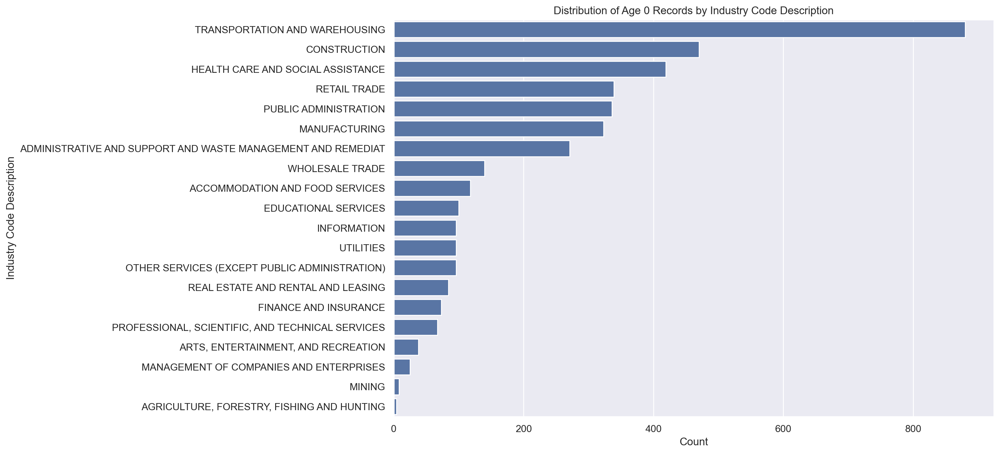

In [42]:
# Filter records where 'Age at Injury' == 0.0
age_zero_records = df[df['Age at Injury'] == 0.0]

# Select relevant columns for analysis
columns_of_interest = ['Industry Code Description', 'WCIO Cause of Injury Description', 'Number of Dependents', 'Birth Year', 'Accident Date']
age_zero_analysis = age_zero_records[columns_of_interest]

age_zero_records = df[df['Age at Injury'] == 0.0]

# Agrupar por Industry Code Description e WCIO Cause of Injury Description
summary = age_zero_records.groupby(['Industry Code Description', 'WCIO Cause of Injury Description']).size().reset_index(name='Count')

# Mostrar os grupos ordenados pela contagem
summary.sort_values(by='Count', ascending=False)

# Contagem por Industry Code Description
plt.figure(figsize=(12, 8))
sns.countplot(y='Industry Code Description', data=age_zero_records, order=age_zero_records['Industry Code Description'].value_counts().index)
plt.title('Distribution of Age 0 Records by Industry Code Description')
plt.xlabel('Count')
plt.ylabel('Industry Code Description')
plt.show()

In [43]:
# Filtrar registros onde 'Age at Injury' == 0 e 'Birth Year' e 'Accident Date' não são nulos
age_zero_records = df[(df['Age at Injury'] == 0.0) & df['Birth Year'].notna() & df['Accident Date'].notna()]

# Selecionar apenas as variáveis de interesse
selected_columns = age_zero_records[['Birth Year', 'Accident Date', 'Age at Injury']]

# Mostrar os primeiros registros
print(selected_columns.head(40))

                  Birth Year Accident Date  Age at Injury
Claim Identifier                                         
5393876                  0.0    2019-12-20            0.0
5393971                  0.0    2019-06-26            0.0
5394093                  0.0    2019-12-28            0.0
5394216                  0.0    2008-12-22            0.0
5394724                  0.0    2019-12-20            0.0
5394831                  0.0    1995-03-11            0.0
5395723                  0.0    2018-01-03            0.0
5396110                  0.0    2019-11-05            0.0
5396359                  0.0    1999-09-29            0.0
5397594                  0.0    2019-11-01            0.0
5397850                  0.0    2019-11-25            0.0
5398089                  0.0    2019-04-16            0.0
5398360                  0.0    2020-01-07            0.0
5398727                  0.0    1998-11-22            0.0
5399016               1901.0    2019-08-11            0.0
5399243       

__Observations and Treatment Plan for `Age at Injury` = 0__
Upon analyzing the `Age at Injury` variable, we identified several cases where the age was recorded as **0**. Initially, these entries appeared inconsistent due to:

1. **Invalid `Birth Year` Values**:  
   Many entries had `Birth Year` values like **0.0** or **1901.0**, suggesting placeholders or missing data.

2. **Non-Zero `Number of Dependents`**:  
   Some records showed a non-zero `Number of Dependents`, which seemed inconsistent for infants.

3. **Industry and Injury Types**:  
   These records were associated with industries such as **Construction**, **Transportation**, and **Health Care**, which typically do not involve infants as workers.

In [45]:
df["Alternative Dispute Resolution"].value_counts()

Alternative Dispute Resolution
N    571412
Y      2609
U         5
Name: count, dtype: int64

> The 'U' should be treated has a missing value

In [47]:
##check if all the values are between 2020 and 2022

assembly_date_counts = df['Assembly Date'].value_counts()

sorted_assembly_date_counts = assembly_date_counts.sort_index()
print(sorted_assembly_date_counts)

Assembly Date
2020-01-01    169
2020-01-02    546
2020-01-03    836
2020-01-04     21
2020-01-05     18
             ... 
2022-12-27    633
2022-12-28    684
2022-12-29    684
2022-12-30    629
2022-12-31     19
Name: count, Length: 1096, dtype: int64


In [48]:
df["Attorney/Representative"].value_counts()

Attorney/Representative
N    392291
Y    181735
Name: count, dtype: int64

In [49]:
salary_bins = [-1, 1, 50, 100, 200, 500, 600, 1500, 3000, 10000, 50000, 1000000, 3000000]  # Salary range boundaries
salary_labels = ["0","1-50", "50-100", "100-200", "200-500", "500-600", "600-1500", "1500-3000", "3000-10000", "10000-500000","50000-1000000", "1000000 +"]  # Labels for each salary range

salary_category_counts = pd.cut(df['Average Weekly Wage'], bins=salary_bins, labels=salary_labels).value_counts().sort_index()

print(salary_category_counts)

Average Weekly Wage
0                335450
1-50                 23
50-100              119
100-200            1732
200-500           22815
500-600           13355
600-1500         113202
1500-3000         53554
3000-10000         5064
10000-500000         42
50000-1000000        14
1000000 +             5
Name: count, dtype: int64


> As observed earlier, some of the salaries appear unexpectedly high.

In [51]:
birth_years_counts = df['Birth Year'].value_counts()

sorted_birth_years_counts = birth_years_counts.sort_index(ascending=True)
print(sorted_birth_years_counts)

Birth Year
0.0       25081
1900.0        2
1901.0       30
1902.0       28
1903.0       35
          ...  
2011.0        6
2012.0        2
2013.0        1
2014.0        2
2018.0        2
Name: count, Length: 107, dtype: int64


> The '0' values should be treated has missing values, some values look very unlikely (ex: 1900)

In [53]:
c2_dates_counts = df['C-2 Date'].value_counts()

c2_dates_counts = c2_dates_counts.sort_index(ascending=True)
print(c2_dates_counts)

C-2 Date
1996-01-12    1
1996-01-31    1
1996-02-14    2
1996-03-06    1
1996-03-29    1
             ..
2024-05-13    2
2024-05-15    1
2024-05-17    1
2024-05-31    2
2024-06-01    1
Name: count, Length: 2475, dtype: int64


In [54]:
c3_dates_counts = df['C-3 Date'].value_counts()

c3_dates_counts = c3_dates_counts.sort_index(ascending=True)
print(c3_dates_counts)

C-3 Date
1992-11-13     1
2010-05-14     1
2010-07-29     1
2010-08-27     1
2010-10-08     1
              ..
2024-05-24    10
2024-05-28     8
2024-05-29     3
2024-05-30     4
2024-05-31     1
Name: count, Length: 1648, dtype: int64


In [55]:
carrier_list = df["Carrier Name"].unique().tolist()

print(carrier_list)
print(len(carrier_list))

['HARTFORD FIRE INSURANCE CO', 'ZURICH AMERICAN INSURANCE CO', 'DELHAIZE AMERICA, LLC', 'SAFETY NATIONAL CASUALTY CORP', 'STATE INSURANCE FUND', 'TOWN OF LANCASTER', 'SELECTIVE INSURANCE COMPANY', 'AMTRUST INS CO OF KANSAS INC', 'TECHNOLOGY INSURANCE CO INC', 'UNIVERSITY OF ROCHESTER 1979', 'WEGMANS FOOD MARKETS, INC.', 'NEW HAMPSHIRE INSURANCE CO', 'WAL-MART ASSOCIATES, INC.', 'POLICE, FIRE, SANITATION', 'INDEMNITY INS. OF N AMERICA', 'XL INSURANCE AMERICA', 'AMERICAN ZURICH INSURANCE CO', 'FEDERAL INSURANCE COMPANY', 'LM INSURANCE CORP', 'ACIG INSURANCE COMPANY', 'FIRE DISTRICTS OF NEW YORK', "PENNSYLVANIA MANUFACTURERS'", 'MEMIC CASUALTY COMPANY', 'AMGUARD INSURANCE COMPANY', 'CHEROKEE INSURANCE COMPANY', 'NYC TRANSIT AUTHORITY', 'ST. LAWRENCE-LEWIS COUNTIES', 'PUBLIC EMPLOYERS RISK MGMT.', 'SOMPO AMERICA FIRE & MARINE', 'INDEMNITY INSURANCE CO OF', 'ARCH INDEMNITY INSURANCE CO', 'OTSEGO COUNTY SELF INSURANCE', 'OLD REPUBLIC INSURANCE CO.', 'HARTFORD ACCIDENT & INDEMNITY', 'LIBERTY 

> Some values are the same but have comas or points

In [57]:
df["Carrier Type"].value_counts()

Carrier Type
1A. PRIVATE                                    285368
3A. SELF PUBLIC                                121920
2A. SIF                                        111144
4A. SELF PRIVATE                                52788
UNKNOWN                                          1774
5D. SPECIAL FUND - UNKNOWN                       1023
5C. SPECIAL FUND - POI CARRIER WCB MENANDS          5
5A. SPECIAL FUND - CONS. COMM. (SECT. 25-A)         4
Name: count, dtype: int64

In [58]:
#Check if we have only New York County
county_list = df["County of Injury"].unique().tolist()

print(county_list)

['GENESEE', 'WYOMING', 'ALBANY', 'ORANGE', 'ONONDAGA', 'ERIE', 'SCHENECTADY', 'ONEIDA', 'TOMPKINS', 'CATTARAUGUS', 'LIVINGSTON', 'MONROE', 'SUFFOLK', 'MADISON', 'ST. LAWRENCE', 'CAYUGA', 'CHEMUNG', 'DUTCHESS', 'SENECA', 'CHAUTAUQUA', 'OTSEGO', 'NIAGARA', 'TIOGA', 'YATES', 'BROOME', 'PUTNAM', 'SCHUYLER', 'WARREN', 'NASSAU', 'QUEENS', 'BRONX', 'NEW YORK', 'WESTCHESTER', 'RICHMOND', 'KINGS', 'COLUMBIA', 'SARATOGA', 'RENSSELAER', 'WASHINGTON', 'ULSTER', 'GREENE', 'ROCKLAND', 'ONTARIO', 'SULLIVAN', 'ORLEANS', 'JEFFERSON', 'HERKIMER', 'STEUBEN', 'FULTON', 'UNKNOWN', 'CHENANGO', 'OSWEGO', 'CLINTON', 'DELAWARE', 'LEWIS', 'MONTGOMERY', 'CORTLAND', 'ALLEGANY', 'FRANKLIN', 'ESSEX', 'WAYNE', 'SCHOHARIE', 'HAMILTON', nan]


In [59]:
df["District Name"].value_counts()

District Name
NYC           270779
ALBANY         86171
HAUPPAUGE      60536
BUFFALO        45605
SYRACUSE       44646
ROCHESTER      40449
BINGHAMTON     21864
STATEWIDE       3976
Name: count, dtype: int64

In [60]:
first_date_counts = df['First Hearing Date'].value_counts()

first_date_counts = first_date_counts.sort_index()
print(first_date_counts)

First Hearing Date
2020-01-30     2
2020-01-31     1
2020-02-04     1
2020-02-06    11
2020-02-07     5
              ..
2024-06-03    45
2024-06-04    42
2024-06-05    43
2024-06-06    28
2024-06-07    25
Name: count, Length: 1094, dtype: int64


In [61]:
df["IME-4 Count"].value_counts()

IME-4 Count
1.0     40112
2.0     34504
3.0     16136
4.0     13781
5.0      7680
6.0      6427
7.0      3838
8.0      3156
9.0      1915
10.0     1460
11.0     1002
12.0      807
13.0      516
14.0      396
15.0      273
16.0      214
18.0      140
17.0      125
19.0       79
20.0       56
21.0       53
22.0       34
23.0       19
24.0       16
27.0       14
26.0        8
25.0        7
29.0        5
28.0        4
30.0        4
32.0        4
34.0        4
36.0        3
33.0        2
31.0        2
39.0        2
37.0        1
48.0        1
35.0        1
47.0        1
73.0        1
Name: count, dtype: int64

In [62]:
df['Industry Code'].unique()

array([33., 23., 44., 61., 92., nan, 42., 62., 45., 56., 72., 52., 48.,
       81., 32., 49., 53., 31., 51., 71., 54., 22., 55., 21., 11.])

In [63]:
df['WCIO Cause of Injury Code'].unique()

array([97., 30., nan, 12., 56., 57., 16., 25., 32., 27., 81., 68., 59.,
       29., 87., 79., 13., 31., 60., 99., 74., 17., 52., 89., 26., 19.,
       45., 98., 53., 66., 58., 55., 33., 77., 50., 28., 82., 75., 46.,
        1., 90.,  6.,  2.,  5., 15., 54., 69., 85., 70., 11., 78., 18.,
       84.,  4., 95., 80., 61.,  9., 67., 10.,  3., 76., 65., 93., 48.,
       94., 20., 96., 83., 88.,  7., 86., 41.,  8., 14., 91., 40., 47.])

In [64]:
df['WCIO Nature of Injury Code'].unique()

array([46., 49., 10., nan, 52., 43., 59., 16., 25., 40., 78., 31., 71.,
        1., 28., 37., 34.,  7.,  3., 80., 90.,  4., 65., 13., 47., 53.,
       42., 36., 77., 72., 19., 68., 60.,  2., 41., 69., 73., 54., 91.,
       66., 58., 74., 83., 55., 75., 32., 61., 22., 67., 76., 30., 62.,
       64., 38., 79., 70., 63.])

In [65]:
df['WCIO Part Of Body Code'].unique()

array([38., 55., nan, 36., 53., 37., 10., 43., 42., -9., 30., 14., 35.,
       90., 17., 61., 54., 56., 32., 39., 13., 44., 20., 41., 31., 34.,
       33., 60., 62., 23., 50., 18., 51., 91., 52., 65., 11., 25., 22.,
       66., 58., 19., 49., 16., 99., 40., 57., 46., 48., 15., 21., 63.,
       12., 64., 45., 24., 47., 26.])

In [66]:
valid_codes = [
    10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 
    21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 30.0, 31.0, 32.0, 33.0, 34.0, 
    35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 
    46.0, 47.0, 48.0, 49.0, 60.0, 61.0, 62.0, 63.0, 50.0, 51.0, 52.0, 
    53.0, 54.0, 55.0, 56.0, 57.0
]

invalid_codes_in_df = df[~df['WCIO Part Of Body Code'].isin(valid_codes)]['WCIO Part Of Body Code'].unique()

print("Values that are not in the 'valid_codes list':", invalid_codes_in_df)

Values that are not in the 'valid_codes list': [nan -9. 90. 91. 65. 66. 58. 99. 64.]


In [67]:
#Check the regions of Medical Fee
df["Medical Fee Region"].value_counts()

Medical Fee Region
IV     265981
I      135885
II      85033
III     53654
UK      33473
Name: count, dtype: int64

> The 'UK' should be treated as nan

In [69]:
def filter_zip_codes(zip_codes):
    valid_zip_codes = []
    invalid_zip_codes = []
    
    for code in zip_codes:
        if isinstance(code, str):
            code = code.strip() 
            
            # Check for valid USA ZIP code (#####)
            if len(code) == 5 and code.isdigit():
                valid_zip_codes.append(code)
            elif len(code) == 10 and code[5] == '-' and code[:5].isdigit() and code[6:].isdigit():
                valid_zip_codes.append(code)
            # Check for valid Canadian Postal Code (A#A #A#)
            elif len(code) == 7 and code[3] == ' ' and code[0:1].isalpha() and code[1:2].isdigit() and code[2:3].isalpha() and \
                 code[4:5].isdigit() and code[5:6].isalpha() and code[6:7].isdigit():
                valid_zip_codes.append(code)
            else:
                invalid_zip_codes.append(code)
        else:
            invalid_zip_codes.append(code)

    return valid_zip_codes, invalid_zip_codes

# Apply the filter function to the 'Zip Code' column
valid_zip_codes, invalid_zip_codes = filter_zip_codes(df['Zip Code'])

# Convert invalid zip codes list to a pandas Series and get unique values
unique_invalid_zip_codes = pd.Series(invalid_zip_codes).unique().tolist()

# Display unique invalid ZIP Codes
print("Unique Invalid ZIP Codes:", unique_invalid_zip_codes)

Unique Invalid ZIP Codes: [nan, 'L1N 5', 'T1B0P', 'L6Y 1', 'JMDMR', 'N2P 1', 'H7X3Z', 'L2N 3', 'L0R 1', 'L1A 3', 'T4R1E', 'L7L 6', 'L2W 1', 'K9K 1', '.1605', 'M4E1S', 'L2A 5', 'T2V', 'UNKNO', 'J0L1B', 'AB106', 'J1H2Y', 'L2A 1', 'T1J5G', 'H2T2W', '22-40', 'M3K2C', 'M3K2B', 'T1S 0', 'N6C4E', 'H1V2L', 'V6Z3G', 'KOC 1', 'M6S5B', 'V3H1H', 'L1C0K', 'L2H0H', 'JOL1B', 'SLV', 'BT48-', 'L5N7C', 'JMDCN', 'V6T1Z', 'T2X3P', 'L2A1R', 'L4A0G', 'K6H2L', 'H1V3S', 'L6H 3', 'JMAKN', 'J0J1S', 'B3E1A', 'V6T5C', 'JMBTS', 'V2B0E', 'T6R 0', 'JMDWD', 'M6K3C', 'L9W', 'S7R 0', 'F94A0', 'P7G', 'Z2E1N', 'L0S1N', 'K2L 4', 'H1G0A', 'B3M 3', 14817.0, 13905.0, 12839.0, 12779.0, 11787.0, 12180.0, 10990.0, 13083.0, 11725.0, 14701.0, 11746.0, 14211.0, 11717.0, 11729.0, 14132.0, 11720.0, 13733.0, 11738.0, 12721.0, 12804.0, 14108.0, 13421.0, 12189.0, 12776.0, 14904.0, 10940.0, 11706.0, 12866.0, 11355.0, 32940.0, 10465.0, 11561.0, 11234.0, 11370.0, 10305.0, 13212.0, 14609.0, 11221.0, 10552.0, 11235.0, 11207.0, 11209.0, 1121

In [70]:
valid_zip_codes = pd.Series(valid_zip_codes).unique().tolist()
print(valid_zip_codes)

['14569', '12189', '18426', '13202', '14086', '12150', '13354', '13068', '14743', '14517', '14420', '11701', '13032', '13669', '11704', '14580', '14606', '13092', '13203', '14614', '13212', '14830', '12569', '14202', '13476', '11950', '14025', '14428', '11788', '11746', '13694', '14004', '14048', '11776', '13326', '14108', '14609', '11779', '11941', '14423', '14883', '11764', '14171', '14464', '11742', '13108', '14304', '14903', '11717', '14701', '14623', '11784', '13029', '14094', '13102', '11967', '14170', '14622', '14478', '11754', '13088', '14223', '13165', '14612', '11772', '12550', '85750', '13790', '14075', '14620', '14527', '11796', '13662', '10512', '13435', '14891', '14213', '11756', '13646', '12603', '12205', '12589', '14621', '11769', '12801', '12306', '12116', '12208', '11550', '11428', '11377', '10475', '07010', '10703', '10314', '11206', '11208', '10462', '10466', '10473', '11378', '11101', '08872', '12533', '12534', '12771', '12019', '06422', '10804', '10452', '10128', 

In [71]:
# Remove '.0' from invalid zip codes
cleaned_zip_codes = []

for code in invalid_zip_codes:
    if isinstance(code, float) and code.is_integer():
        cleaned_zip_codes.append(str(int(code)))  # Convert to int to remove '.0'
    else:
        cleaned_zip_codes.append(str(code))  # Keep other codes as is

unique_cleaned_zip_codes = pd.Series(cleaned_zip_codes).unique().tolist()
print("Cleaned ZIP Codes:", unique_cleaned_zip_codes)

Cleaned ZIP Codes: ['nan', 'L1N 5', 'T1B0P', 'L6Y 1', 'JMDMR', 'N2P 1', 'H7X3Z', 'L2N 3', 'L0R 1', 'L1A 3', 'T4R1E', 'L7L 6', 'L2W 1', 'K9K 1', '.1605', 'M4E1S', 'L2A 5', 'T2V', 'UNKNO', 'J0L1B', 'AB106', 'J1H2Y', 'L2A 1', 'T1J5G', 'H2T2W', '22-40', 'M3K2C', 'M3K2B', 'T1S 0', 'N6C4E', 'H1V2L', 'V6Z3G', 'KOC 1', 'M6S5B', 'V3H1H', 'L1C0K', 'L2H0H', 'JOL1B', 'SLV', 'BT48-', 'L5N7C', 'JMDCN', 'V6T1Z', 'T2X3P', 'L2A1R', 'L4A0G', 'K6H2L', 'H1V3S', 'L6H 3', 'JMAKN', 'J0J1S', 'B3E1A', 'V6T5C', 'JMBTS', 'V2B0E', 'T6R 0', 'JMDWD', 'M6K3C', 'L9W', 'S7R 0', 'F94A0', 'P7G', 'Z2E1N', 'L0S1N', 'K2L 4', 'H1G0A', 'B3M 3', '14817', '13905', '12839', '12779', '11787', '12180', '10990', '13083', '11725', '14701', '11746', '14211', '11717', '11729', '14132', '11720', '13733', '11738', '12721', '12804', '14108', '13421', '12189', '12776', '14904', '10940', '11706', '12866', '11355', '32940', '10465', '11561', '11234', '11370', '10305', '13212', '14609', '11221', '10552', '11235', '11207', '11209', '11218', 

In [72]:
invalid_zip_codes = []

for code in unique_cleaned_zip_codes:
    #check if the zip code does not have exactly 5 characters or is not numeric
    if not (len(code) == 5 and code.isnumeric()):
        invalid_zip_codes.append(code)

print(invalid_zip_codes)

['nan', 'L1N 5', 'T1B0P', 'L6Y 1', 'JMDMR', 'N2P 1', 'H7X3Z', 'L2N 3', 'L0R 1', 'L1A 3', 'T4R1E', 'L7L 6', 'L2W 1', 'K9K 1', '.1605', 'M4E1S', 'L2A 5', 'T2V', 'UNKNO', 'J0L1B', 'AB106', 'J1H2Y', 'L2A 1', 'T1J5G', 'H2T2W', '22-40', 'M3K2C', 'M3K2B', 'T1S 0', 'N6C4E', 'H1V2L', 'V6Z3G', 'KOC 1', 'M6S5B', 'V3H1H', 'L1C0K', 'L2H0H', 'JOL1B', 'SLV', 'BT48-', 'L5N7C', 'JMDCN', 'V6T1Z', 'T2X3P', 'L2A1R', 'L4A0G', 'K6H2L', 'H1V3S', 'L6H 3', 'JMAKN', 'J0J1S', 'B3E1A', 'V6T5C', 'JMBTS', 'V2B0E', 'T6R 0', 'JMDWD', 'M6K3C', 'L9W', 'S7R 0', 'F94A0', 'P7G', 'Z2E1N', 'L0S1N', 'K2L 4', 'H1G0A', 'B3M 3', '7822', '7047', '6482', '7032', '7062', '7104', '6763', '7070', '7040', '6820', '7882', '7726', '7052', '7421', '7642', '7660', '7728', '7103', '6610', '6810', '7601', '7083', '7093', '7302', '8527', '5478', '7632', '6606', '7738', '8857', '8618', '7306', '7304', '677', '7458', '7834', '7018', '7011', '7624', '7603', '6401', '6830', '7036', '8863', '7206', '7073', '7105', '7002', '7305', '7108', '7463',

In [73]:
df["Agreement Reached"].value_counts()

Agreement Reached
0.0    547239
1.0     26787
Name: count, dtype: int64

In [74]:
df["Number of Dependents"].value_counts()

Number of Dependents
6.0    82653
3.0    82299
5.0    82075
4.0    81904
1.0    81823
0.0    81665
2.0    81607
Name: count, dtype: int64

<a class="anchor" id="imports">
    
#### 2.2.1. Treating Incoherences

</a>


In [76]:
df = df.replace('nan', np.nan)
df = df.replace('UK', np.nan)
df = df.replace('U', np.nan)
df['County of Injury'] = df['County of Injury'].replace('UNKNOWN', np.nan)


df['WCIO Part Of Body Code'] = df['WCIO Part Of Body Code'].replace([-9.0, 90.0, 91.0, 65.0, 66.0, 58.0, 99.0, 64.0],np.nan)

df['Birth Year'] = df['Birth Year'].replace([0.0], np.nan)
df['Age at Injury'] = df['Age at Injury'].replace([0.0], np.nan)

In [77]:
test = test.replace('nan', np.nan)
test = test.replace('UK', np.nan)
test = test.replace('U', np.nan)
test['County of Injury'] = test['County of Injury'].replace('UNKNOWN', np.nan)


df['WCIO Part Of Body Code'] = df['WCIO Part Of Body Code'].replace([-9.0, 90.0, 91.0, 65.0, 66.0, 58.0, 99.0, 64.0],np.nan)

# Replace 0.0 in the 'Birth Year' column with NaN
df['Birth Year'] = df['Birth Year'].replace([0.0], np.nan)
test['Age at Injury'] = test['Age at Injury'].replace([0.0], np.nan)

In [78]:
# Replace invalid zip codes with NaN
df['Zip Code'] = df['Zip Code'].apply(lambda x: np.nan if x in invalid_zip_codes else x)
test['Zip Code'] = test['Zip Code'].apply(lambda x: np.nan if x in invalid_zip_codes else x)

In [79]:
df['Carrier Name'] = df['Carrier Name'].str.replace('.', '', regex = False).str.replace(',', '', regex = False)
test['Carrier Name'] = test['Carrier Name'].str.replace('.', '', regex = False).str.replace(',', '', regex = False)

In [80]:
initial_row_count = len(df)

invalid_accident_date_condition = (
    (df['Accident Date'] > df['C-2 Date']) |
    (df['Accident Date'] > df['C-3 Date']) |
    (df['Accident Date'] > df['Assembly Date']) |
    (df['Accident Date'] > df['First Hearing Date'])
)

#set Accident Date to nan for invalid rows
df.loc[invalid_accident_date_condition, 'Accident Date'] = np.nan

final_row_count = len(df)
rows_affected = invalid_accident_date_condition.sum()
percentage_affected = (rows_affected / initial_row_count) * 100

print(f"Percentage of rows affected: {percentage_affected:.2f}%")

Percentage of rows affected: 0.29%


In [81]:
invalid_accident_date_condition_test = (
    (test['Accident Date'] > test['C-2 Date']) |
    (test['Accident Date'] > test['C-3 Date']) |
    (test['Accident Date'] > test['Assembly Date']) |
    (test['Accident Date'] > test['First Hearing Date'])
)

test.loc[invalid_accident_date_condition_test, 'Accident Date'] = np.nan

In [82]:
#We decided to drop all rows that contain only the 'Assembly Date' and the index 'Claim Identifier'
columns_to_check = ['Accident Date', 'Age at Injury', 'Alternative Dispute Resolution',
                    'Attorney/Representative', 'Average Weekly Wage',
                    'Birth Year', 'C-2 Date', 'C-3 Date', 'Carrier Name', 'Carrier Type',
                    'Claim Injury Type', 'County of Injury',
                    'COVID-19 Indicator', 'District Name', 'First Hearing Date', 'Gender',
                    'IME-4 Count', 'Industry Code', 'Industry Code Description',
                    'Medical Fee Region', 'OIICS Nature of Injury Description',
                    'WCIO Cause of Injury Code', 'WCIO Cause of Injury Description',
                    'WCIO Nature of Injury Code', 'WCIO Nature of Injury Description',
                    'WCIO Part Of Body Code', 'WCIO Part Of Body Description', 'Zip Code',
                    'Agreement Reached', 'WCB Decision', 'Number of Dependents']

condition = df[columns_to_check].isna().all(axis=1)

df = df[~condition]

final_row_count = len(df)

percentage_dropped = ((initial_row_count - final_row_count) / initial_row_count) * 100
print(f"Percentage of rows dropped: {percentage_dropped:.2f}%")

Percentage of rows dropped: 3.28%


In [83]:
#check the % of missing values of each variable
missing_values = df.isna().sum()
missing_percentage = (df.isnull().sum() / len(df)) * 100
missing_data = pd.DataFrame({
    'Missing Values': missing_values,
    'Missing Percentage': missing_percentage
})
# Sort missing_data by 'Missing Percentage' in descending order
missing_data_sorted = missing_data.sort_values(by='Missing Percentage', ascending=False)
print(missing_data_sorted)

                                    Missing Values  Missing Percentage
OIICS Nature of Injury Description          574026          100.000000
IME-4 Count                                 441223           76.864637
First Hearing Date                          423228           73.729761
C-3 Date                                    386781           67.380397
WCIO Part Of Body Code                      107173           18.670409
Birth Year                                   54159            9.434938
Medical Fee Region                           33473            5.831269
Zip Code                                     28986            5.049597
Average Weekly Wage                          28651            4.991237
WCIO Part Of Body Description                17082            2.975823
WCIO Nature of Injury Description            15657            2.727577
WCIO Nature of Injury Code                   15657            2.727577
WCIO Cause of Injury Description             15640            2.724615
WCIO C

**RULE** Many data science resources recommend thresholds around 30% to 50% missing values as a rule of thumb. Above this threshold, filling the values can introduce bias or noise, and removing the variable might be preferable.

__Critical Missing Data Analysis:__

1. **C-3 Date**: 67.38% missing. 
- **Action**: With such a high percentage of missing data, this column is a candidate for removal unless there’s a specific reason to retain it. The data might not be available for most cases.
   

2. **First Hearing Date**: 73.72% missing.
- **Action**: This column has an even higher percentage of missing data. If it’s not essential for the analysis, it’s recommended to remove it.

3. **IME-4 Count**: 76.86% missing.
- **Action**: This column can likely be removed due to the high percentage of missing values, as it may not be relevant to most cases.

4. **OIICS Nature of Injury Description**: 100.00% missing.
- **Action**: Since all values are missing, this column should be removed from the dataset.

__Final Recommendation:__
- **Columns to take attention at**: "C-3 Date", "First Hearing Date", "IME-4 Count", "OIICS Nature of Injury Description".
- These columns have high percentages of missing data and are unlikely to provide meaningful insights in their current state. It's best to drop them to improve data quality and reduce unnecessary noise in your analysis
- However, before dropping them, we should see if they can provide relevant insights

#### __Target Variable__

In [86]:
df['Claim Injury Type'].unique()

array(['4. TEMPORARY', '2. NON-COMP', '1. CANCELLED', '5. PPD SCH LOSS',
       '3. MED ONLY', '6. PPD NSL', '8. DEATH', '7. PTD'], dtype=object)

In [87]:
# Summary statistics for Claim Injury Type
num_unique_types = df['Claim Injury Type'].nunique()
most_common_type = df['Claim Injury Type'].mode()[0]

print(f"Total number of unique Claim Injury Types: {num_unique_types}")
print(f"Most common Claim Injury Type: {most_common_type}")

Total number of unique Claim Injury Types: 8
Most common Claim Injury Type: 2. NON-COMP


In [88]:
claim_type_counts = df['Claim Injury Type'].value_counts(dropna=False)
claim_type_percent = df['Claim Injury Type'].value_counts(normalize=True, dropna=False) * 100

# Convert the frequencies to a list for calculations
frequencies = claim_type_counts.values
# Skewness: Measure of asymmetry in the distribution
target_skewness = skew(frequencies)
# Kurtosis: Measure of the "tailedness" of the distribution
target_kurtosis = kurtosis(frequencies)
# Entropy: Measure of diversity in the target variable
target_entropy = entropy(frequencies, base=2)
# Coefficient of Variation (CV): Ratio of standard deviation to the mean
mean_claims = claim_type_counts.mean()
std_claims = claim_type_counts.std()
cv = std_claims / mean_claims

# Display statistics
print("Absolute Frequency:")
print(claim_type_counts)

print("\nRelative Frequency (%):")
print(claim_type_percent)

print(f"\nSkewness: {target_skewness:.2f}")
print(f"Kurtosis: {target_kurtosis:.2f}")
print(f"Entropy: {target_entropy:.2f}")
print(f"Coefficient of Variation (CV): {cv:.2f}")


Absolute Frequency:
Claim Injury Type
2. NON-COMP        291078
4. TEMPORARY       148507
3. MED ONLY         68906
5. PPD SCH LOSS     48280
1. CANCELLED        12477
6. PPD NSL           4211
8. DEATH              470
7. PTD                 97
Name: count, dtype: int64

Relative Frequency (%):
Claim Injury Type
2. NON-COMP        50.708156
4. TEMPORARY       25.871128
3. MED ONLY        12.003986
5. PPD SCH LOSS     8.410769
1. CANCELLED        2.173595
6. PPD NSL          0.733590
8. DEATH            0.081878
7. PTD              0.016898
Name: proportion, dtype: float64

Skewness: 1.40
Kurtosis: 0.67
Entropy: 1.85
Coefficient of Variation (CV): 1.42


In [89]:
# Generate summary statistics for the 'Claim Injury Type' target variable
summary_stats = claim_type_counts.describe()

summary_stats

count         8.000000
mean      71753.250000
std      102011.997644
min          97.000000
25%        3275.750000
50%       30378.500000
75%       88806.250000
max      291078.000000
Name: count, dtype: float64

In [90]:
missing_percentage = df['Claim Injury Type'].isna().mean() * 100
print(f"Percentage of missing values in 'Claim Injury Type': {missing_percentage:.2f}%")


Percentage of missing values in 'Claim Injury Type': 0.00%


<a class="anchor" id="visuals">
    
### 2.3 Visualisations

</a>

In [92]:
# Separating numeric and non-numeric columns
numeric_columns = ['Age at Injury', 'Average Weekly Wage', 'Birth Year', 'IME-4 Count', 'Number of Dependents']

non_numeric_columns = ['Alternative Dispute Resolution', 
        'Attorney/Representative', 'Carrier Name',
        'Carrier Type', 'Claim Injury Type', 'County of Injury',
        'COVID-19 Indicator', 'District Name', 'Gender',
        'Industry Code Description', 'Medical Fee Region',
        'WCIO Cause of Injury Description', 'WCIO Nature of Injury Description',
        'WCIO Part Of Body Description','Industry Code', 'WCIO Cause of Injury Code',
        'WCIO Nature of Injury Code',
        'WCIO Part Of Body Code', 'Zip Code', 'WCB Decision','Agreement Reached']

date_time_columns = ['Accident Date','Assembly Date', 'C-2 Date', 'C-3 Date', 'First Hearing Date']

<a class="anchor" id="numerics">
    
#### 2.3.1 Numeric Features

</a>

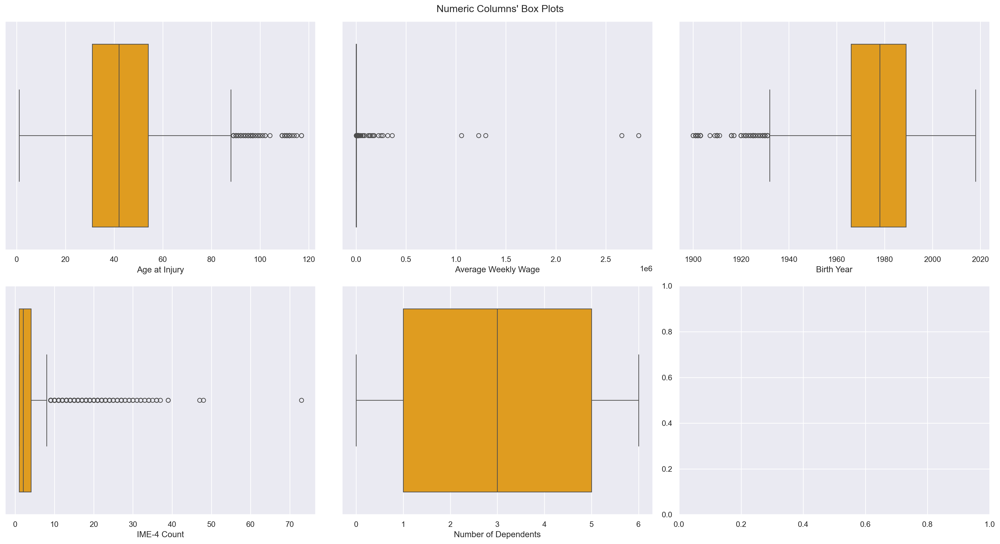

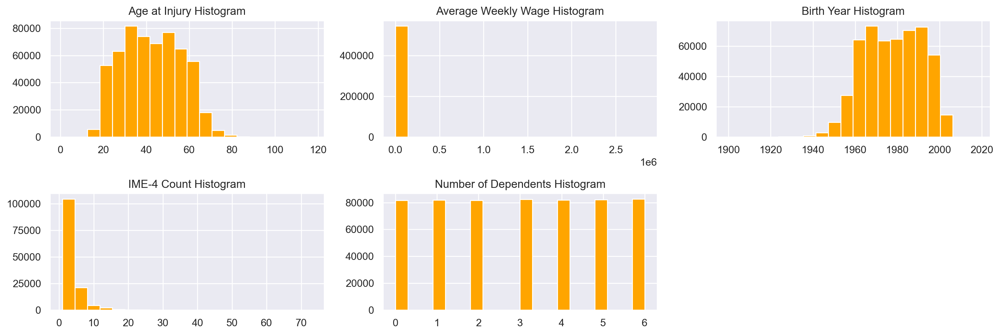

In [94]:
sns.set() ## Reset to darkgrid

sp_rows = 2
sp_cols = ceil(len(numeric_columns) / sp_rows)

fig, axes = plt.subplots(sp_rows, 
                         sp_cols, 
                         figsize=(20, 11),
                         tight_layout=True
                        )

for ax, feat in zip(axes.flatten(), numeric_columns):
    sns.boxplot(x=df[feat].dropna(), ax=ax, color='orange')
    
title = "Numeric Columns' Box Plots"

plt.suptitle(title)

if not os.path.exists(os.path.join('..', 'figures', 'eda')):
    os.makedirs(os.path.join('..', 'figures', 'eda'))


plt.savefig(os.path.join('..', 'figures', 'eda', 'numeric_columns_boxplots.png'), dpi=200)


plt.show()


plt.figure(figsize=(15, 10))

for i, column in enumerate(numeric_columns, 1):
    plt.subplot(4, 3, i)
    df[column].hist(bins=20, color='orange')
    plt.title(f'{column} Histogram')

plt.tight_layout()
plt.show()

1. **Age at Injury**:
- **Most Common Range**: Between 25 and 55 years old, with outliers above 100 years.
- **Relevance**: Outliers (ages above 100) likely indicate incorrect data entries. These should be handled during preprocessing, either by removing or correcting them, to avoid affecting model predictions.

2. **Average Weekly Wage**:
- **Most Common Range**: Below 1000, but with extreme outliers above 1 million.
- **Relevance**: The presence of extreme outliers in wages could distort the model’s accuracy. These should be reviewed, capped, or removed as part of data cleaning to ensure they don’t skew the analysis.

3. **Birth Year**:
- **Most Common Range**: Mostly valid, but some birth years are implausibly low (e.g., below 1900).
- **Relevance**: These implausible birth years suggest errors that need correction or removal to maintain data integrity during analysis.

4. **Number of Dependents**:
- **Most Common Range**: Ranges between 0 and 6 dependents.
- **Relevance**: This variable has a reasonable distribution and can be used as-is for further analysis.

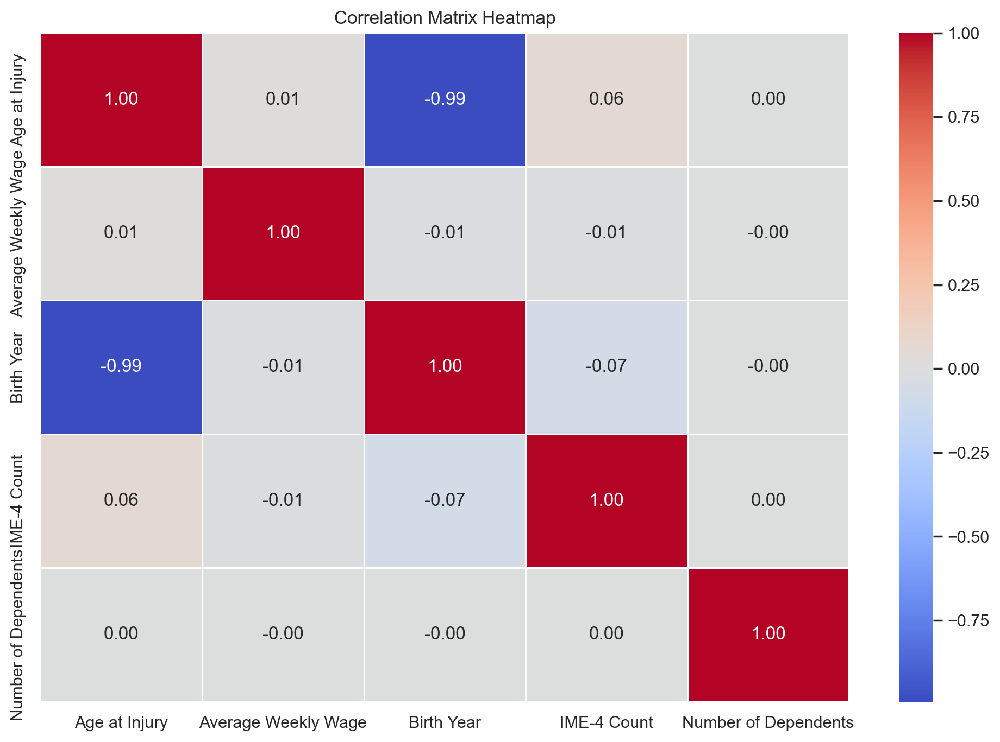

In [96]:
# 1. Calculating the correlation matrix
correlation_matrix = df[numeric_columns].corr()

# 2. Plotting the heatmap for the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

_Birth Year_ and _Age at injury_ are highly correlated has expected, instead other variables doesn't have correlation.

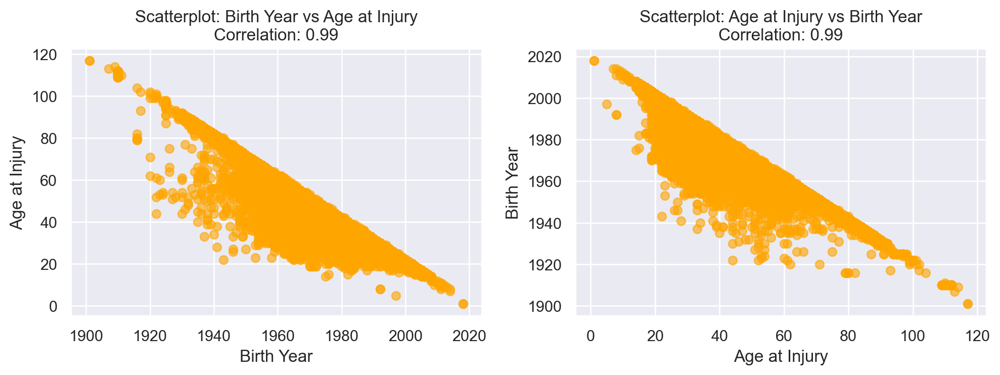

In [98]:
threshold = 0.7
correlation_matrix = df[numeric_columns].corr()

corr_pairs = correlation_matrix.unstack().abs().sort_values(ascending=False)
strong_corr_pairs = corr_pairs[(abs(corr_pairs) > threshold) & (corr_pairs < 1)]
strong_corr_pairs = strong_corr_pairs.head(9)

plt.figure(figsize=(15, 10))

for i, (pair, corr_value) in enumerate(strong_corr_pairs.items(), 1):
    var1, var2 = pair
    plt.subplot(3, 3, i)  # 3x3 grid of subplots
    plt.scatter(df[var1], df[var2], alpha=0.6,color='orange')
    plt.title(f'Scatterplot: {var1} vs {var2}\nCorrelation: {corr_value:.2f}')
    plt.xlabel(var1)
    plt.ylabel(var2)

plt.tight_layout()
plt.show()

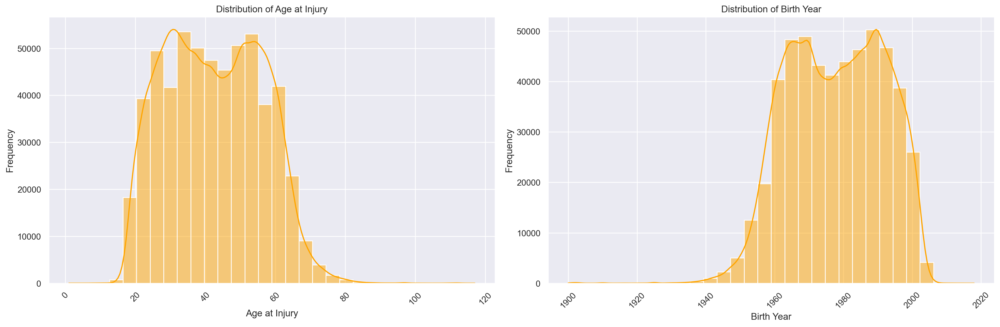

In [99]:
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.histplot(df['Age at Injury'], bins=30, kde=True, color='orange', ax=axes[0])
axes[0].set_title('Distribution of Age at Injury')
axes[0].set_xlabel('Age at Injury')
axes[0].set_ylabel('Frequency')
axes[0].tick_params(axis='x', rotation=45)  

sns.histplot(df['Birth Year'], bins=30, kde=True, color='orange', ax=axes[1])
axes[1].set_title('Distribution of Birth Year')
axes[1].set_xlabel('Birth Year')
axes[1].set_ylabel('Frequency')
axes[1].tick_params(axis='x', rotation=45)  # Rotate x-axis labels

plt.tight_layout()
plt.show()

**Observation**: _Age at injury_ and  _Birth Year_ have the same distribution, but opposite, as we expected from the highnegative correlation.

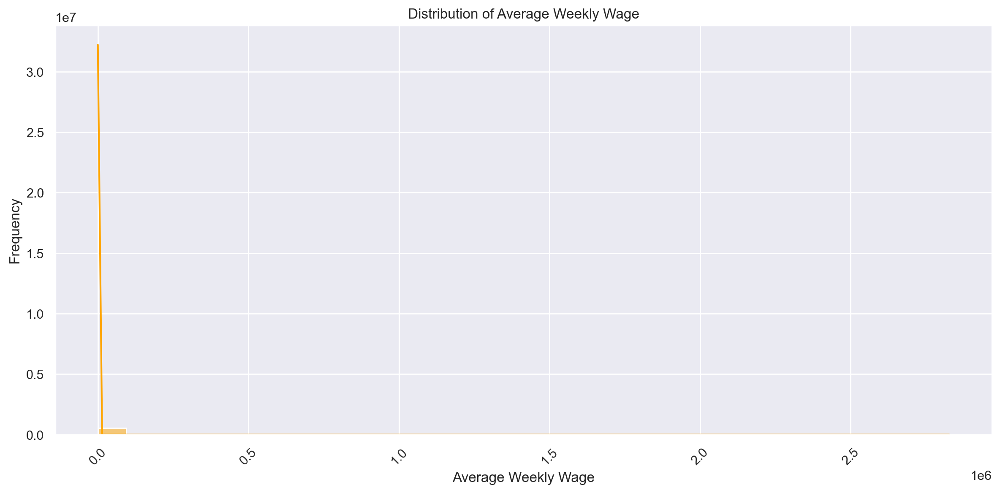

In [101]:
#Redundant
plt.figure(figsize=(12, 6))
sns.histplot(df['Average Weekly Wage'], bins=30, kde=True, color='orange')
plt.title('Distribution of Average Weekly Wage')
plt.xlabel( 'Average Weekly Wage')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<a class="anchor" id="categoricals">
    
#### 2.3.2 Categorical Features

</a>

In this section we will see the occurances of the different categorical features, we grouped them in macro sets:
- Regions
- WCIO Descriptions Codes Columns
- Bivariate Features

#### Regions
1) _Zip Code_

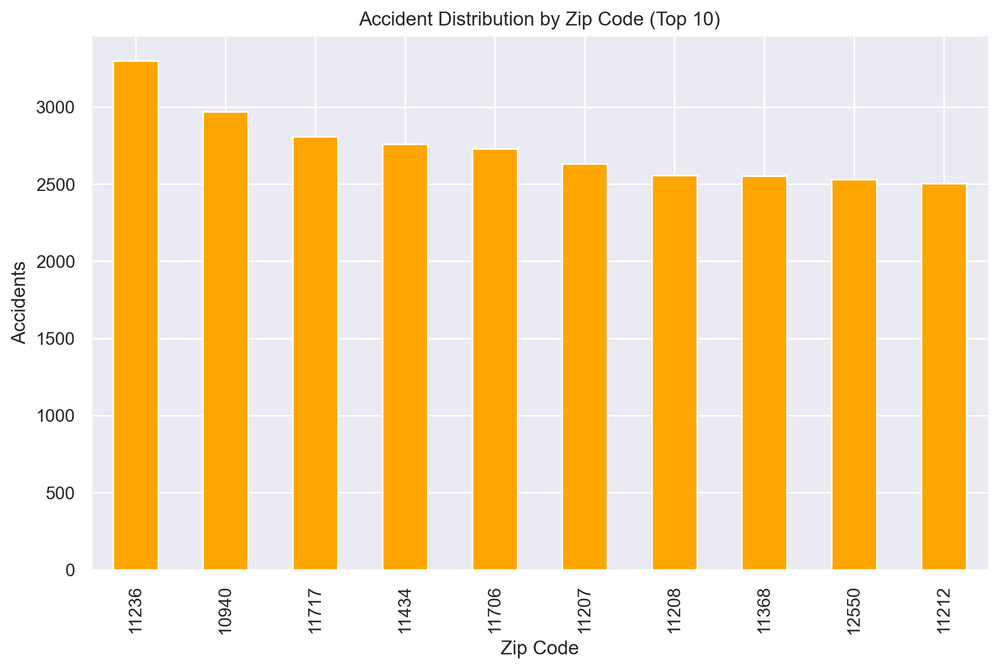

In [105]:
# Analyze accident occurrences by zip code
zip_counts = df['Zip Code'].value_counts().head(10)  # Show top 10 most frequent

# Plot the results
plt.figure(figsize=(10, 6))
zip_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Zip Code (Top 10)')
plt.xlabel('Zip Code')
plt.ylabel('Accidents')
plt.show()

2) _County of injury_

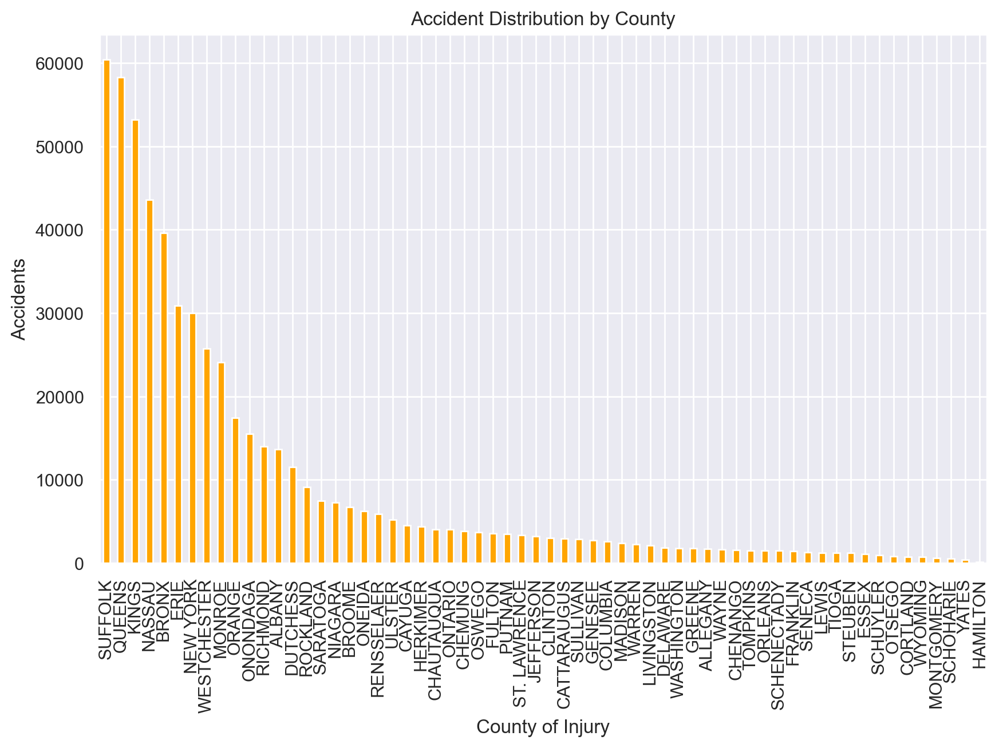

In [107]:
counts = df['County of Injury'].value_counts()  # Show top 10 most frequent

# Plot the results
plt.figure(figsize=(10, 6))
counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by County')
plt.xlabel('County of Injury')
plt.ylabel('Accidents')
plt.show()

3) _District Name_

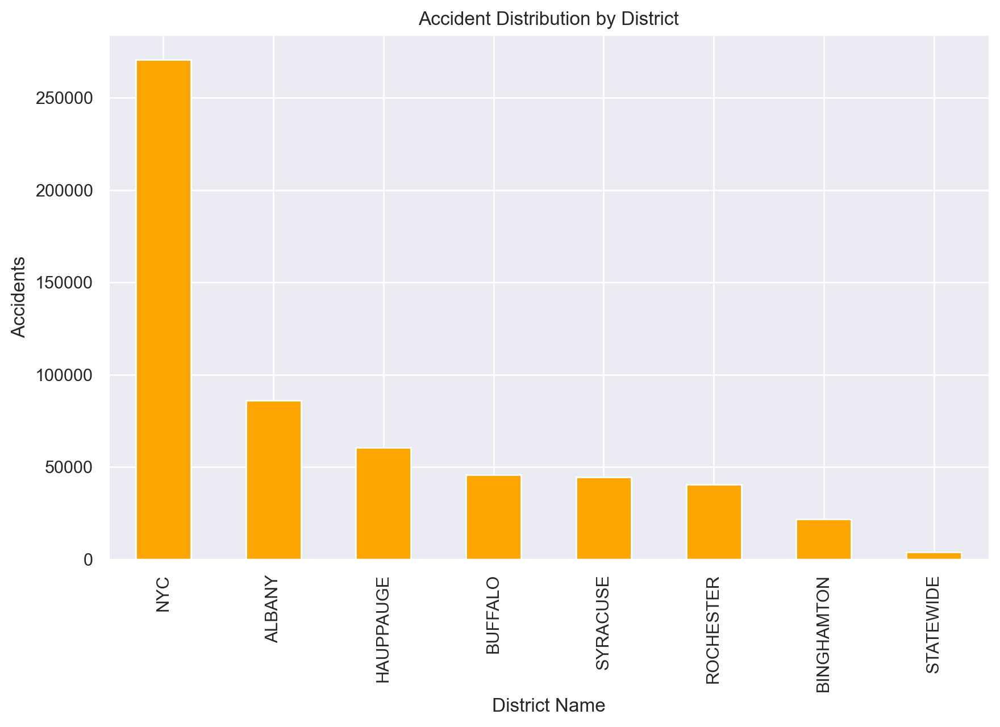

In [109]:
# Analyze accident occurrences by district
counts = df['District Name'].value_counts() 

plt.figure(figsize=(10, 6))
counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by District')
plt.xlabel('District Name')
plt.ylabel('Accidents')
plt.show()

4) _Medical Fee Reion_

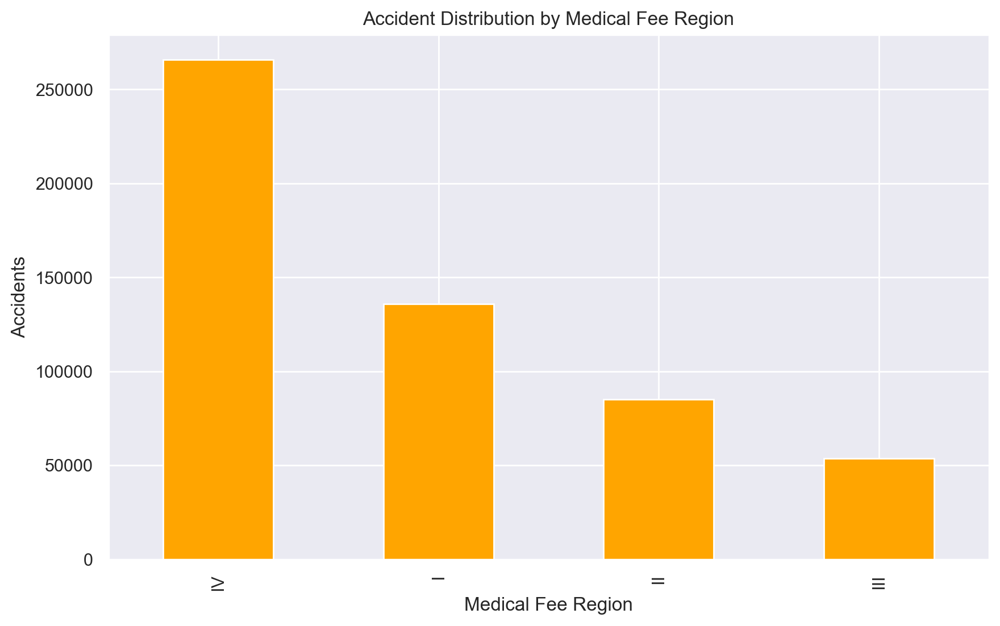

In [111]:
# Analyze accident occurrences by medical region
counts = df['Medical Fee Region'].value_counts() 

plt.figure(figsize=(10, 6))
counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Medical Fee Region')
plt.xlabel('Medical Fee Region')
plt.ylabel('Accidents')
plt.show()

#### Descriptions of Codes Columns

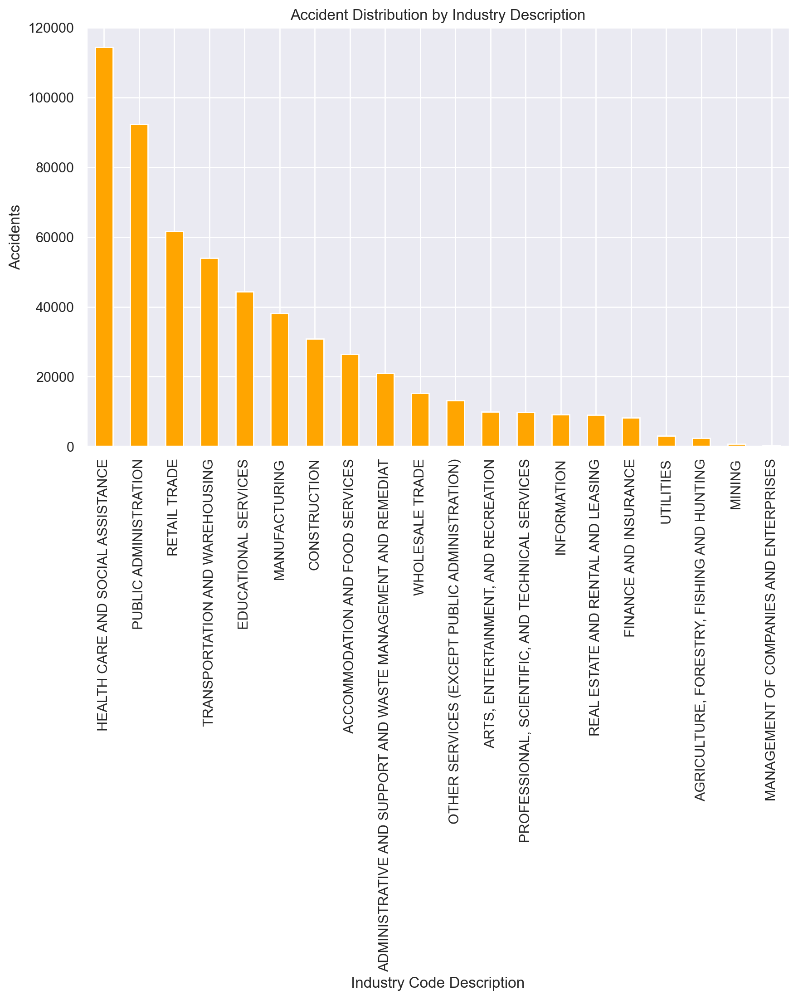

In [113]:
descriptions_counts = df['Industry Code Description'].value_counts() 

plt.figure(figsize=(10, 6))
descriptions_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Industry Description')
plt.xlabel('Industry Code Description')
plt.ylabel('Accidents')
plt.show()

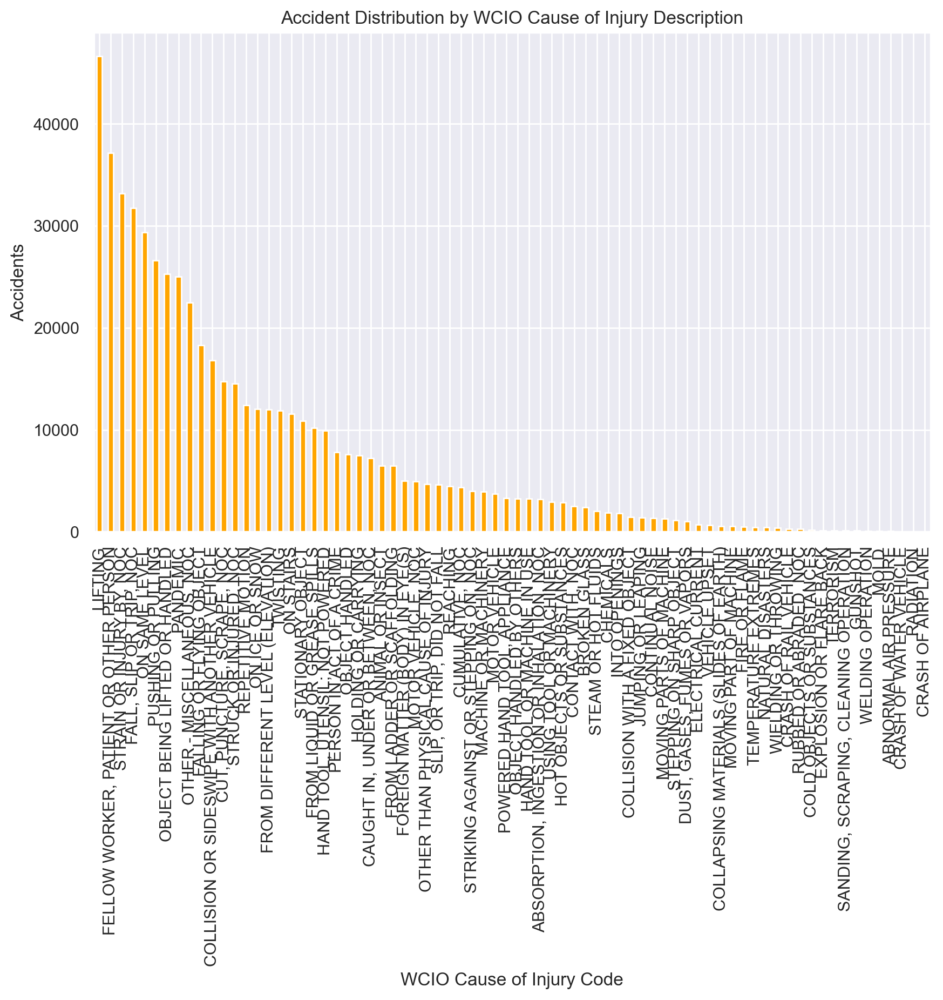

In [114]:
descriptions_counts = df['WCIO Cause of Injury Description'].value_counts() 
plt.figure(figsize=(10, 6))
descriptions_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by WCIO Cause of Injury Description')
plt.xlabel('WCIO Cause of Injury Code')
plt.ylabel('Accidents')
plt.show()

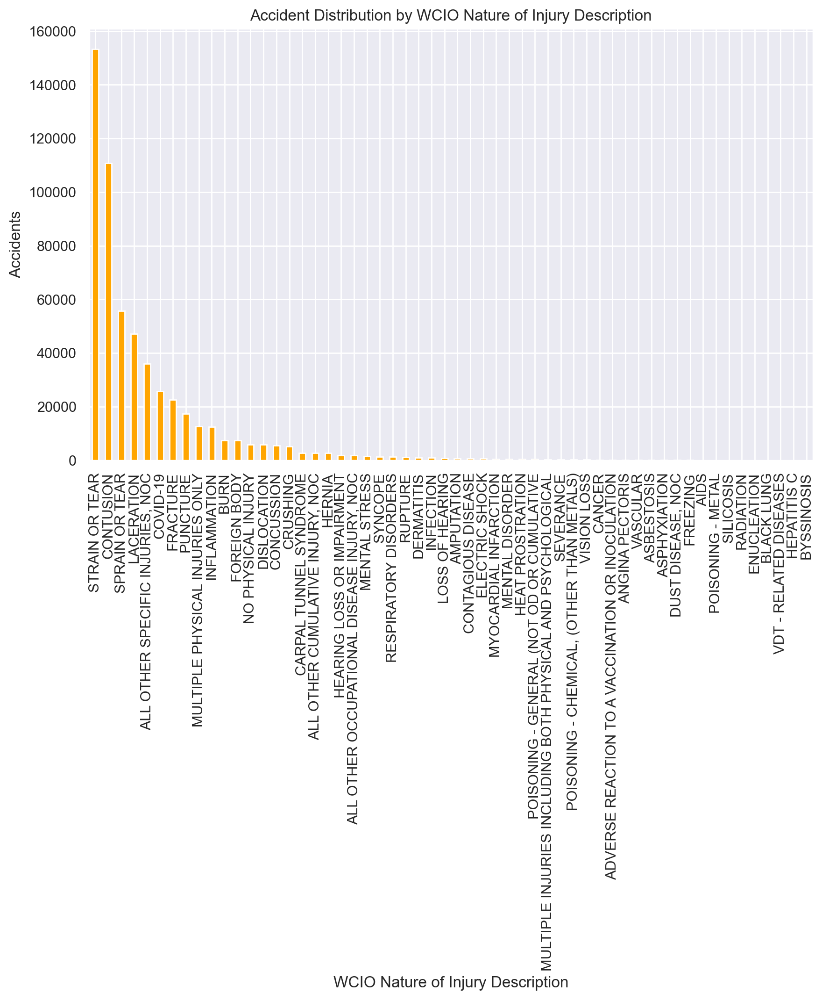

In [115]:
code_counts = df['WCIO Nature of Injury Description'].value_counts() 
plt.figure(figsize=(10, 6))
code_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by WCIO Nature of Injury Description')
plt.xlabel('WCIO Nature of Injury Description')
plt.ylabel('Accidents')
plt.show()

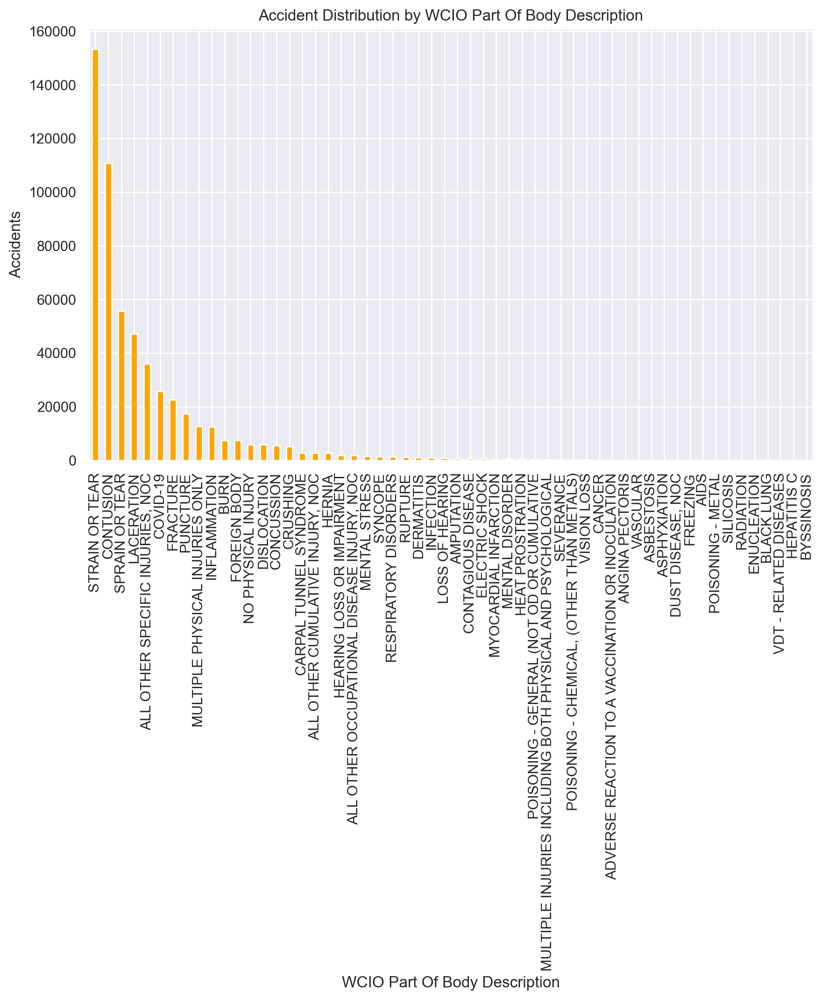

In [116]:
description_counts = df['WCIO Part Of Body Description'].value_counts() 
plt.figure(figsize=(10, 6))
code_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by WCIO Part Of Body Description')
plt.xlabel('WCIO Part Of Body Description')
plt.ylabel('Accidents')
plt.show()

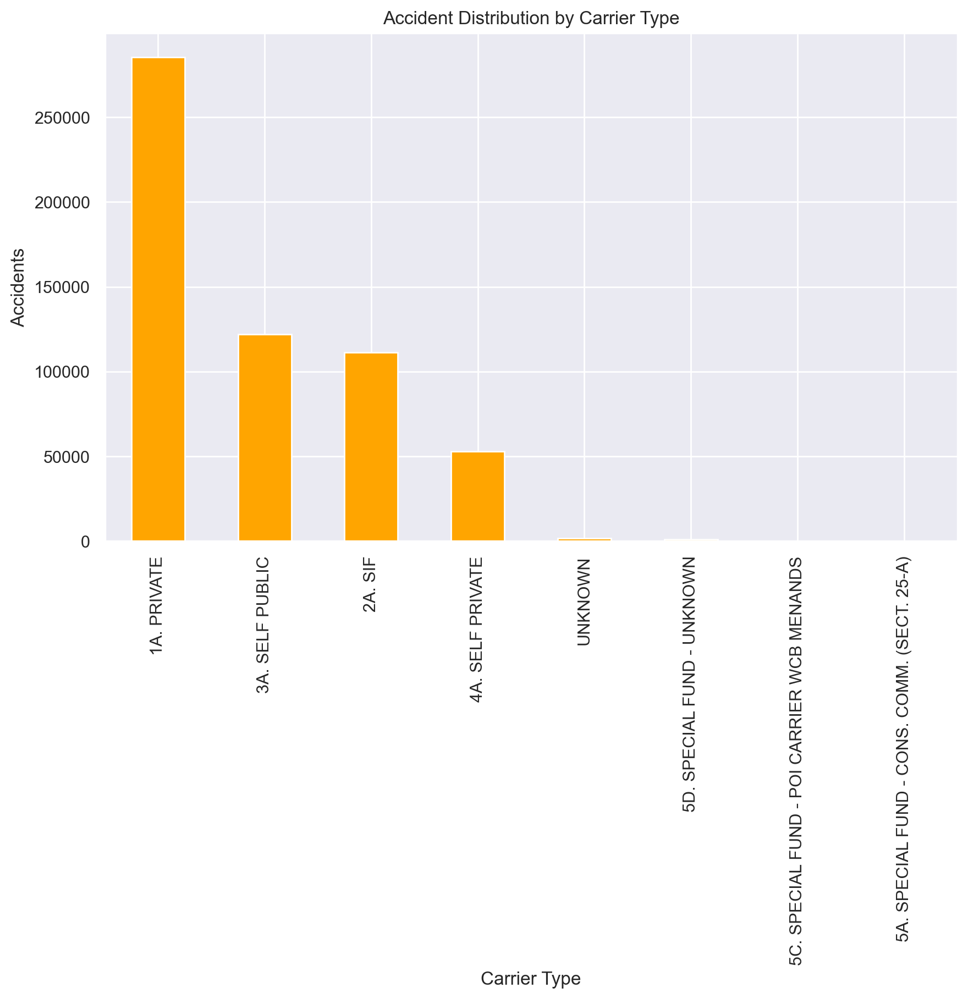

In [117]:
counts = df['Carrier Type'].value_counts() 
plt.figure(figsize=(10, 6))
counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Carrier Type')
plt.xlabel('Carrier Type')
plt.ylabel('Accidents')
plt.show()

#### Bivariate Features

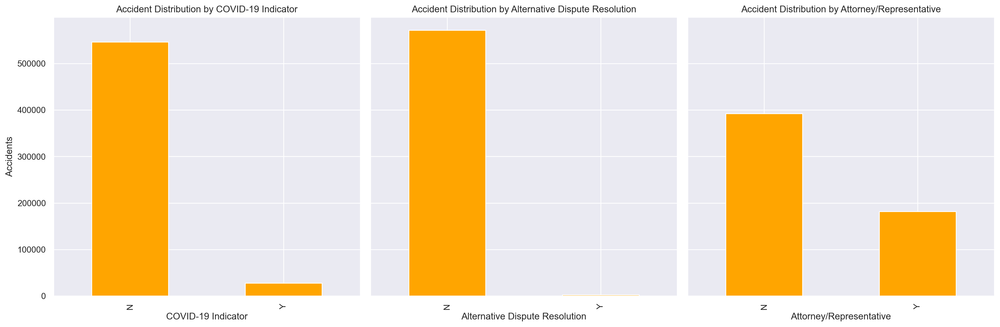

In [119]:
covid_counts = df['COVID-19 Indicator'].value_counts()
adr_counts = df['Alternative Dispute Resolution'].value_counts()
attorney_counts = df['Attorney/Representative'].value_counts()

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

covid_counts.plot(kind='bar', color='orange', ax=axes[0])
axes[0].set_title('Accident Distribution by COVID-19 Indicator')
axes[0].set_xlabel('COVID-19 Indicator')
axes[0].set_ylabel('Accidents')

adr_counts.plot(kind='bar', color='orange', ax=axes[1])
axes[1].set_title('Accident Distribution by Alternative Dispute Resolution')
axes[1].set_xlabel('Alternative Dispute Resolution')

attorney_counts.plot(kind='bar', color='orange', ax=axes[2])
axes[2].set_title('Accident Distribution by Attorney/Representative')
axes[2].set_xlabel('Attorney/Representative')

plt.tight_layout()
plt.show()


<a class="anchor" id="dates">
    
#### 2.3.3. Datatime Features

</a>


We decided to use the dates to get more insights from when the accident occur the most, grouping per:
- Years (from 2000 to 2023)
- Months of the year
- Days of the week

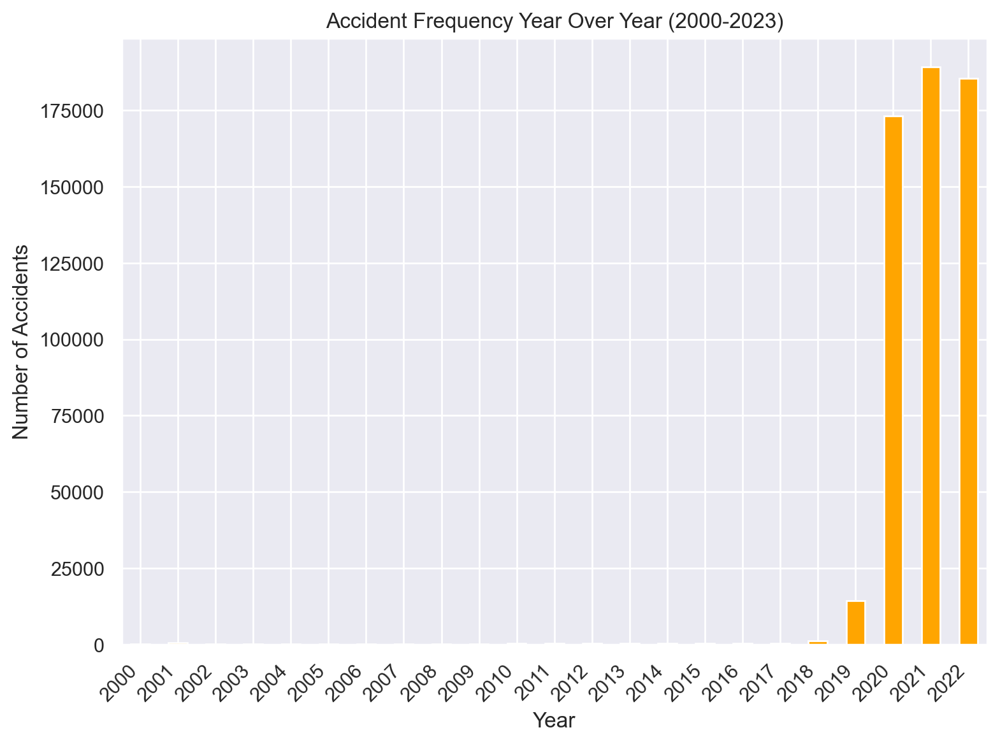

In [122]:
filtered_df = df[(df['Accident Date'].dt.year >= 2000) & (df['Accident Date'].dt.year <= 2023)]

accidents_per_year = filtered_df['Accident Date'].dt.year.value_counts().sort_index()

plt.figure(figsize=(8, 6))

accidents_per_year.plot(kind='bar', color='orange')
plt.title('Accident Frequency Year Over Year (2000-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')
plt.tight_layout()


plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()


From this we can't see clearly the Accident Dates before the year 2018, so we decided to split and doing one before this year, to see the values.

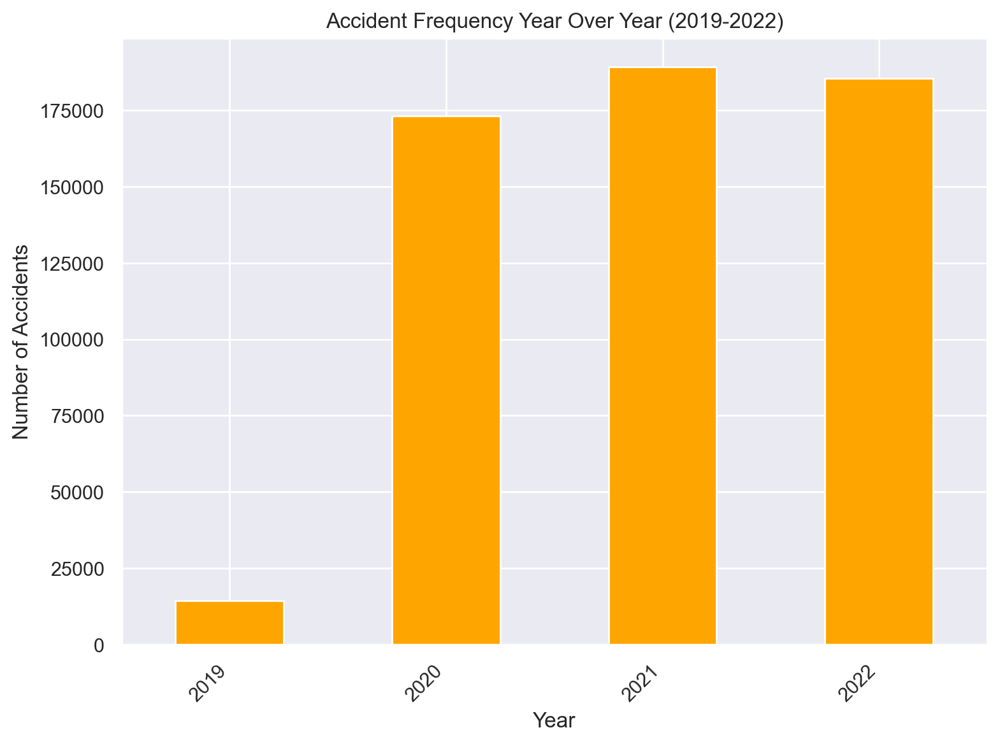

In [124]:
# Extract the year directly and filter for the desired range (2019-2022)

filtered_df = df[(df['Accident Date'].dt.year >= 2019) & (df['Accident Date'].dt.year <= 2022)]
accidents_per_year = filtered_df['Accident Date'].dt.year.value_counts().sort_index()

plt.figure(figsize=(8, 6))
accidents_per_year.plot(kind='bar', color='orange')
plt.title('Accident Frequency Year Over Year (2019-2022)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')

plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

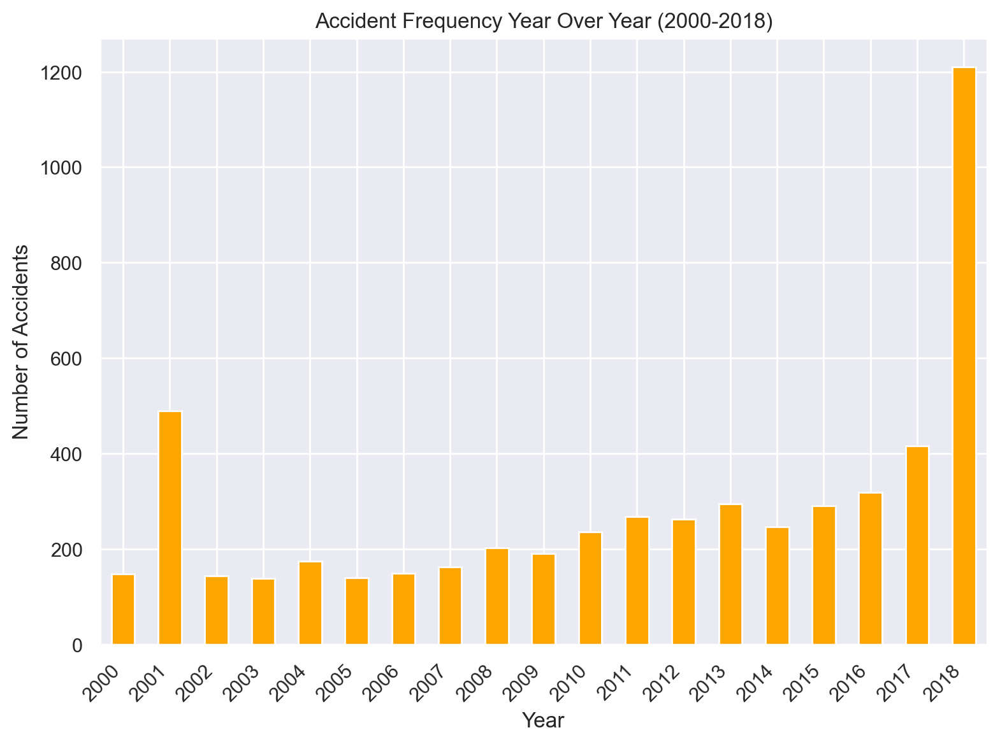

In [125]:
# Extract the year directly and filter for the desired range (2000-2018)
filtered_df = df[(df['Accident Date'].dt.year >= 2000) & (df['Accident Date'].dt.year <= 2018)]

accidents_per_year = filtered_df['Accident Date'].dt.year.value_counts().sort_index()

# Plot the bar chart
plt.figure(figsize=(8, 6))
accidents_per_year.plot(kind='bar', color='orange')
plt.title('Accident Frequency Year Over Year (2000-2018)')
plt.xlabel('Year')
plt.ylabel('Number of Accidents')

# Rotate x-axis labels to avoid overlap
plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

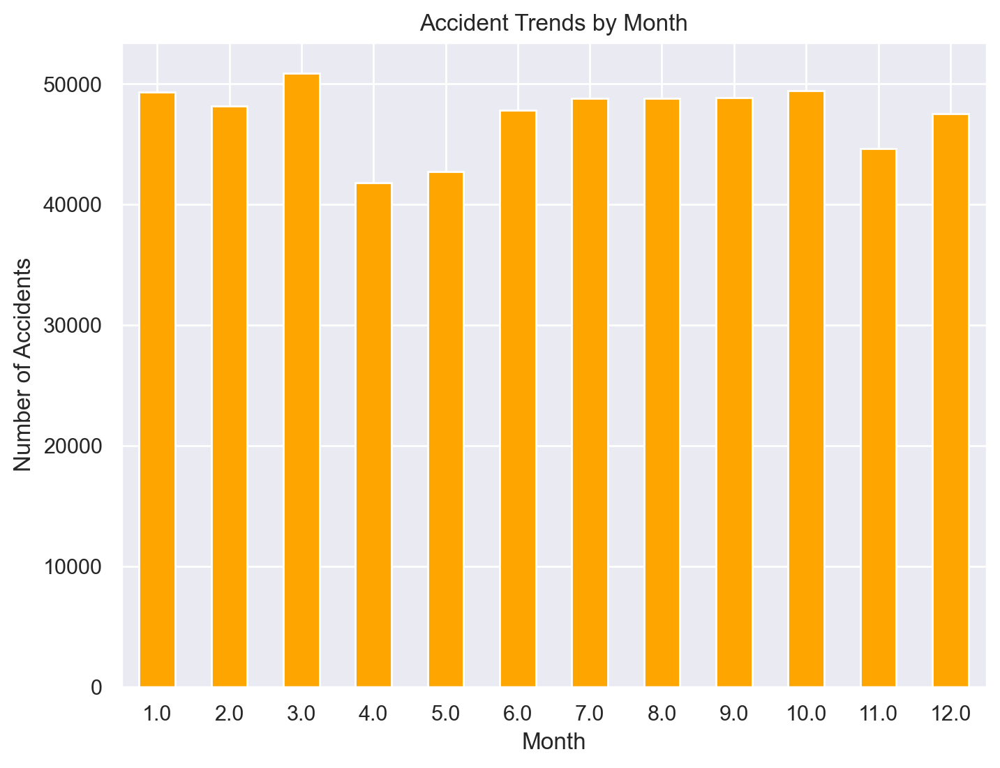

In [126]:
# First, we need to extract the month from the 'Accident Date' to analyze the trends by month.
df_month = df['Accident Date'].dt.month

plt.figure(figsize=(8, 6))
df_month.value_counts().sort_index().plot(kind='bar', color='orange')
plt.title('Accident Trends by Month')
plt.xlabel('Month')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)

plt.show()

No much differences between the months.

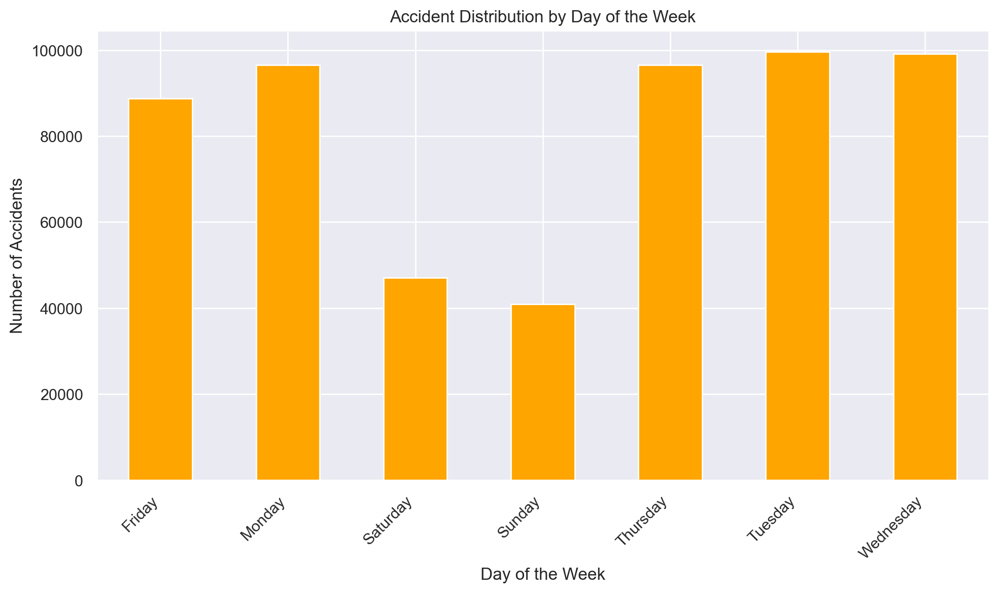

In [128]:
# Extract the weekday directly and map it to weekday names without saving it in df
weekdays_map = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 
                4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
accident_weekday_counts = df['Accident Date'].dt.weekday.map(weekdays_map).value_counts().sort_index()

plt.figure(figsize=(10, 6))
accident_weekday_counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

__Multivariate Analsis__
<br>
Before analyzing the behavior of the target feature, we combined some of the features to see if we could gain additional insights from them.

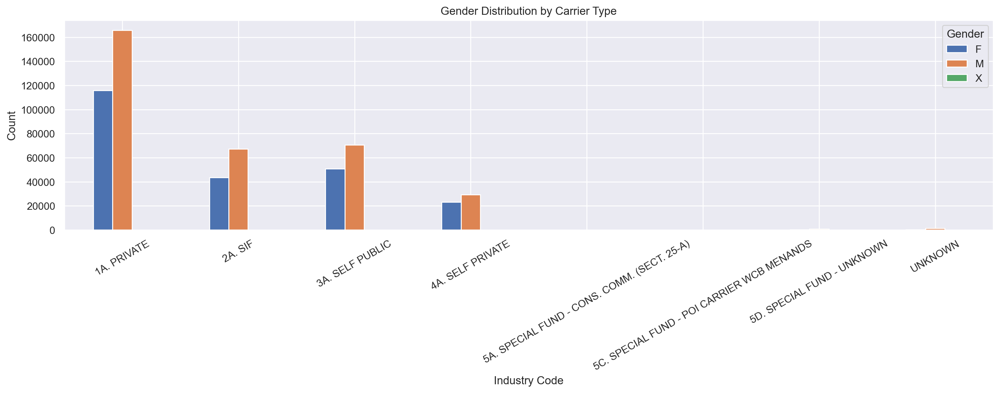

In [130]:
# Grouping by 'Carrier type Code' and 'Gender' and counting the occurrences
gender_industry_counts = df.groupby(['Carrier Type', 'Gender']).size().unstack(fill_value=0)

# Plotting the bar plot
gender_industry_counts.plot(kind='bar', stacked=False, figsize=(15, 6))

# Adding titles and labels
plt.title('Gender Distribution by Carrier Type')
plt.xlabel('CarrierType')
plt.ylabel('Count')
plt.xticks(rotation=30)  # Optional: Keep the x-axis labels horizontal

# Display the plot
plt.tight_layout()
plt.show()


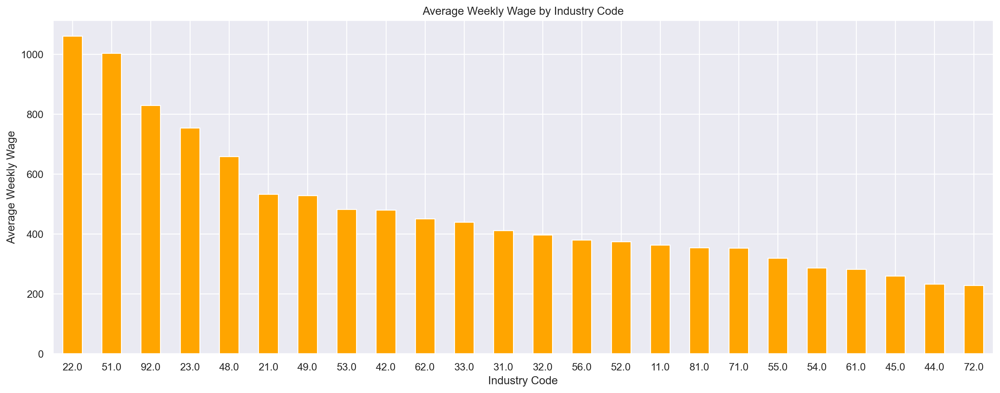

In [131]:
# Grouping by 'Industry Code' and 'Average Weekly Wage' and counting the occurrences
wage_industry_mean = df.groupby('Industry Code')['Average Weekly Wage'].mean()

wage_industry_mean_sorted = wage_industry_mean.sort_values(ascending=False)

wage_industry_mean_sorted.plot(kind='bar', stacked=False, figsize=(15, 6), color='orange')

# Adding titles and labels
plt.title('Average Weekly Wage by Industry Code')
plt.xlabel('Industry Code')
plt.ylabel('Average Weekly Wage')
plt.xticks(rotation=0) 

plt.tight_layout()
plt.show()

<a class="anchor" id="targets">
    
#### 2.3.4 Target

</a>


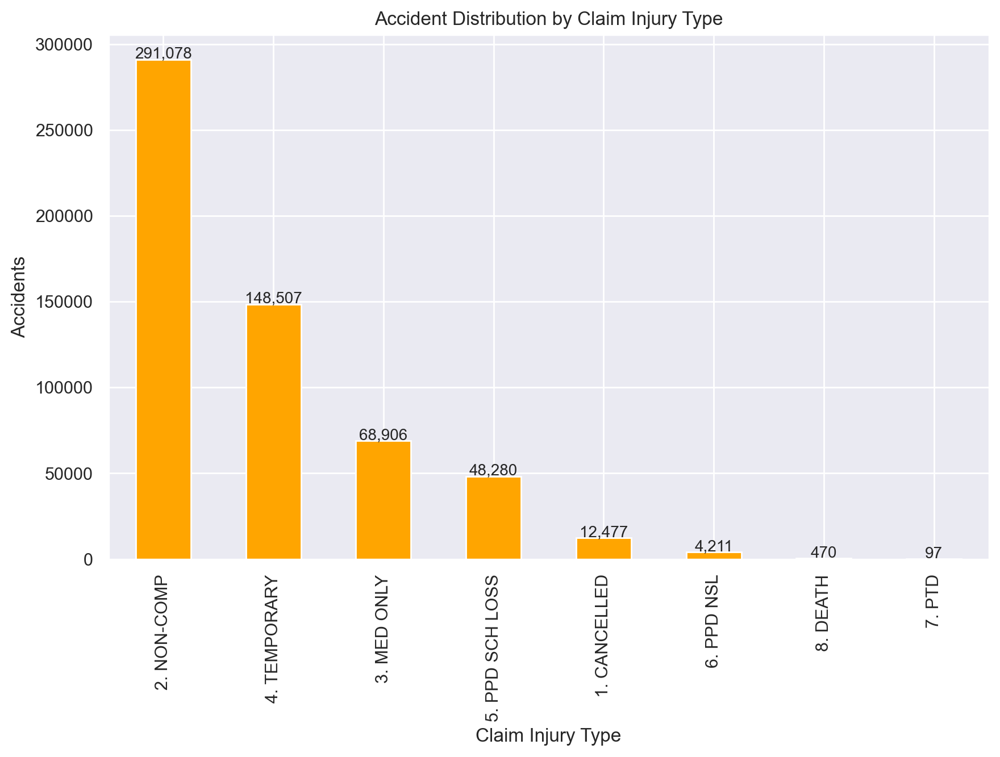

In [133]:
counts = df['Claim Injury Type'].value_counts() 
plt.figure(figsize=(10, 6))
counts.plot(kind='bar', color='orange')
plt.title('Accident Distribution by Claim Injury Type')
plt.xlabel('Claim Injury Type')
plt.ylabel('Accidents')
for index, value in enumerate(claim_type_counts):
    plt.text(index, value + 500, f"{value:,}", ha='center', fontsize=10)
    
plt.show()

### Analysis of `Claim Injury Type` Distribution

- **Highly Imbalanced**:  
  - The target variable shows significant class imbalance, with **`2. NON-COMP`** (291,078) and **`4. TEMPORARY`** (148,507) claims dominating the dataset.
  - **Minority Classes**: Categories like **`7. PTD`** (97) and **`8. DEATH`** (470) are extremely underrepresented.

- **Key Insights**:  
  - **Non-Compensable Claims** (`2. NON-COMP`) are the most frequent, indicating many claims are deemed ineligible.  
  - Severe outcomes such as **`PPD SCH LOSS`**, **`PTD`**, and **`DEATH`** are rare.

---

### Recommendations for Classification Models

- **Class Imbalance Handling**:  
  - Apply **resampling techniques** such as **SMOTE** (Synthetic Minority Over-sampling Technique) or **undersampling** of majority classes.  
  - Use **class weights** in classification models to balance the impact of underrepresented categories.





#### __The target feature in relation with the others  features__

To gain different insights, we utilized both bar charts and heatmaps.

The relationshipe between the target and the following feautres were analyzed
- Type of work: with 'Industry code' and 'Carrier Type'
- 'Average Weekly Wage'
- Geographical Regions: 'Medical Fee Region' and 'District Name'
- 'WCIO part of the body Description'
- Information about the person: 'Age at Injury' and 'Gender'


<Figure size 1500x800 with 0 Axes>

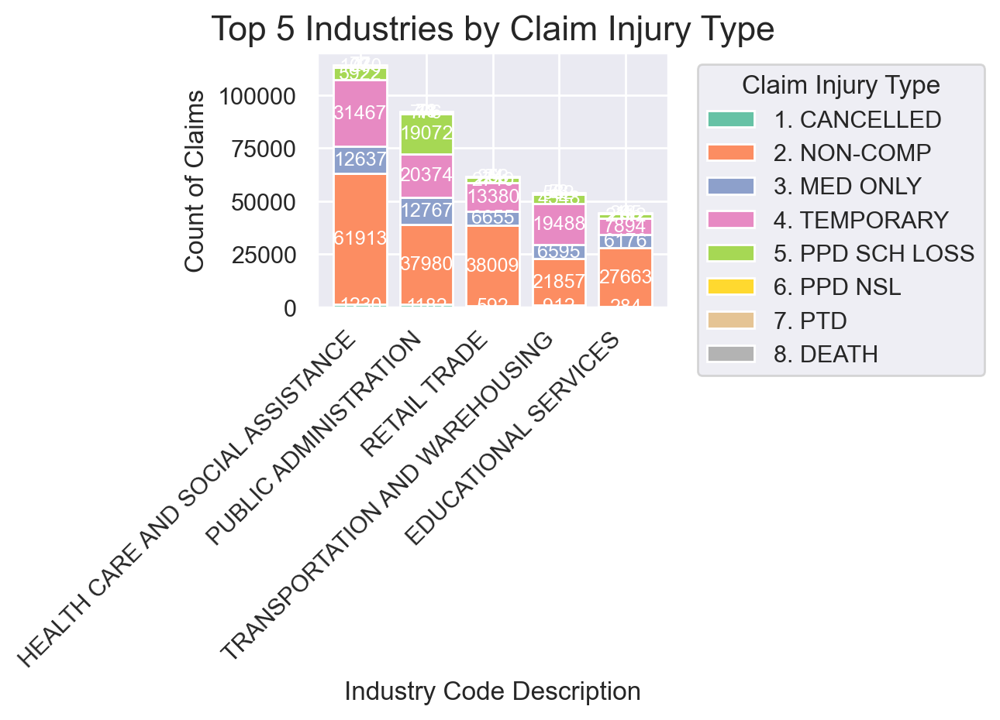

In [137]:
claim_injury_by_industry = pd.crosstab(df['Industry Code Description'], df['Claim Injury Type'])

# Get the top 5 industries with the highest number of claims
top_5_industries = claim_injury_by_industry.sum(axis=1).nlargest(5).index
top_5_data = claim_injury_by_industry.loc[top_5_industries]

plt.figure(figsize=(15, 8))
colors = sns.color_palette('Set2', n_colors=top_5_data.shape[1])
top_5_data.plot(kind='bar', stacked=True, colormap='tab20', color=colors, width=0.8)

plt.title('Top 5 Industries by Claim Injury Type', fontsize=16)
plt.xlabel('Industry Code Description', fontsize=12)
plt.ylabel('Count of Claims', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left')

for container in plt.gca().containers:
    plt.bar_label(container, fmt='%d', label_type='center', fontsize=9, color='white')

plt.tight_layout()
plt.show()

__Insights from the Top 5 Industries by Claim Injury Type__

This chart shows the distribution of **Claim Injury Types** across the **Top 5 Industries** with the highest number of claims:

1. **Health Care and Social Assistance**:
   - Dominated by **Non-Compensable Claims (NON-COMP)** and **Temporary Injuries (TEMPORARY)**.
   - Significant number of **Medical Only (MED ONLY)** claims.

2. **Public Administration**:
   - A high number of **NON-COMP** claims.
   - Noticeable presence of **PPD SCH LOSS** (Permanent Partial Disability - Scheduled Loss) claims.

3. **Retail Trade**:
   - Predominantly **NON-COMP** claims, with notable counts of **Temporary Injuries (TEMPORARY)** and **Medical Only (MED ONLY)** claims.

4. **Transportation and Warehousing**:
   - A large portion of **NON-COMP** claims.
   - Some **PPD SCH LOSS** and **Temporary Injuries**.

5. **Educational Services**:
   - Primarily **NON-COMP** claims with smaller contributions from **Temporary Injuries** and **Medical Only** claims.

### **Key Observations**:
- **Non-Compensable Claims** (orange) are the most frequent across all industries.
- **Health Care and Social Assistance** has the highest diversity of claim types.
- **Permanent Partial Disability (PPD SCH LOSS)** claims are more common in **Public Administration** and **Transportation**.

These insights highlight potential patterns for further analysis or model development.


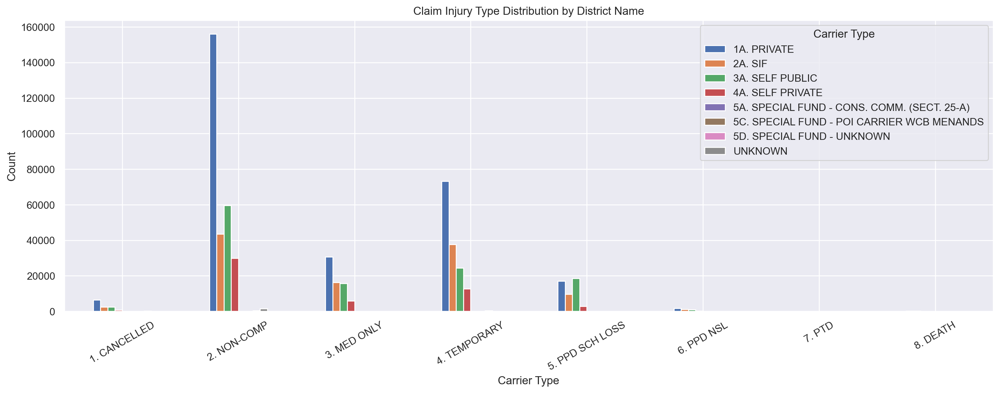

In [141]:
counts = df.groupby(['Claim Injury Type','Carrier Type']).size().unstack(fill_value=0)

counts.plot(kind='bar', stacked=False, figsize=(15, 6))

plt.title('Claim Injury Type Distribution by Carrier Type')
plt.xlabel('Carrier Type')
plt.ylabel('Count')
plt.xticks(rotation=30)  

plt.tight_layout()
plt.show()

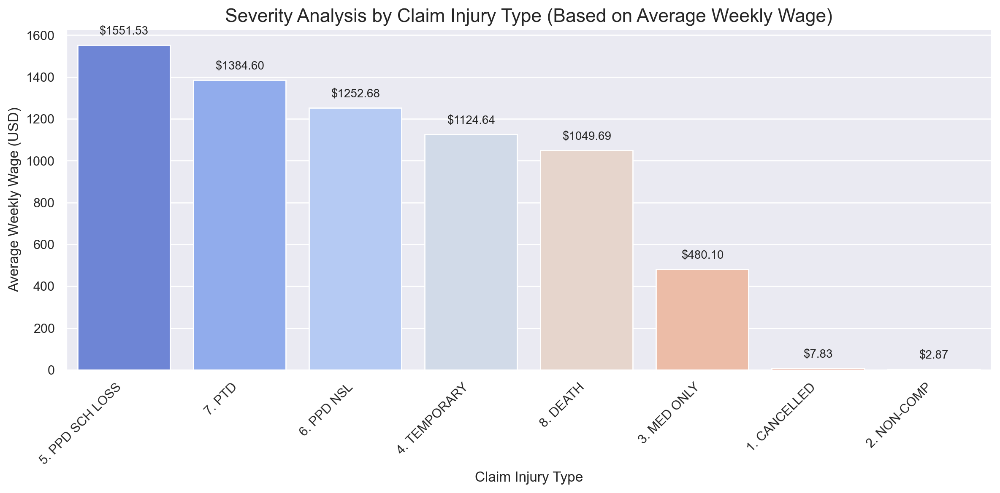

In [139]:
severity_by_claim_type = df.groupby('Claim Injury Type')['Average Weekly Wage'].mean().sort_values(ascending=False)


plt.figure(figsize=(12, 6))
sns.barplot(x=severity_by_claim_type.index, y=severity_by_claim_type.values, palette='coolwarm')
plt.title('Severity Analysis by Claim Injury Type (Based on Average Weekly Wage)', fontsize=16)
plt.xlabel('Claim Injury Type', fontsize=12)
plt.ylabel('Average Weekly Wage (USD)', fontsize=12)
plt.xticks(rotation=45, ha='right')

for index, value in enumerate(severity_by_claim_type.values):
    plt.text(index, value + 50, f"${value:.2f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()

**Severity Analysis by Claim Injury Type**

- **Highest Severity**:  
  - **PPD SCH LOSS** ($1,551.53), **PTD** ($1,384.60), and **PPD NSL** ($1,252.68) have the highest average weekly wages, indicating severe injuries or long-term impairments.

- **Moderate Severity**:  
  - **Temporary** ($1,124.64) and **Death** ($1,049.69) show significant compensation levels, reflecting recoverable injuries or fatalities.

- **Lowest Severity**:  
  - **Non-Compensable (NON-COMP)** ($2.87) and **Cancelled** ($7.83) have minimal compensation, consistent with ineligible or denied claims.

---

**Insights for the Classification Model**

- **High-Severity Claims**:  
  Focus on identifying patterns for **PPD SCH LOSS**, **PTD**, and **PPD NSL** to improve model accuracy.

- **Low-Severity Claims**:  
  Handle **Non-Compensable** and **Cancelled** claims separately to avoid introducing noise into the model.

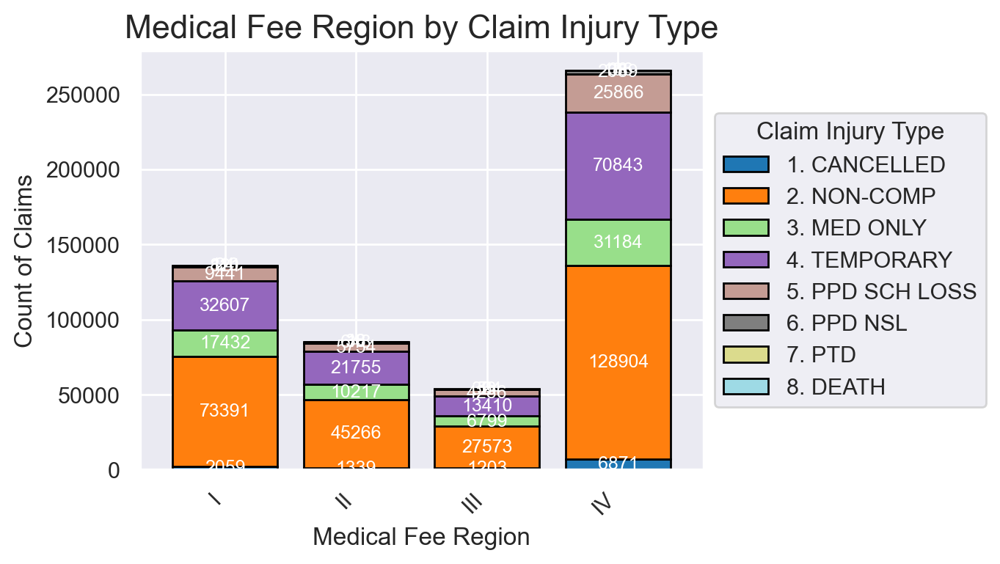

In [275]:
claim_injury_by_region = pd.crosstab(df['Medical Fee Region'], df['Claim Injury Type'])

plt.figure(figsize=(7, 4))

claim_injury_by_region.plot(
    kind='bar', stacked=True, colormap='tab20', width=0.8, edgecolor='black', ax=plt.gca()
)

plt.title('Medical Fee Region by Claim Injury Type', fontsize=16)
plt.xlabel('Medical Fee Region', fontsize=12)
plt.ylabel('Count of Claims', fontsize=12)
plt.xticks(rotation=45, ha='right')

plt.legend(
    title='Claim Injury Type', 
    bbox_to_anchor=(1.02, 0.5),  
    loc='center left', 
    borderaxespad=0.
)

ax = plt.gca()  
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='center', fontsize=9, color='white')

plt.tight_layout()
plt.show()


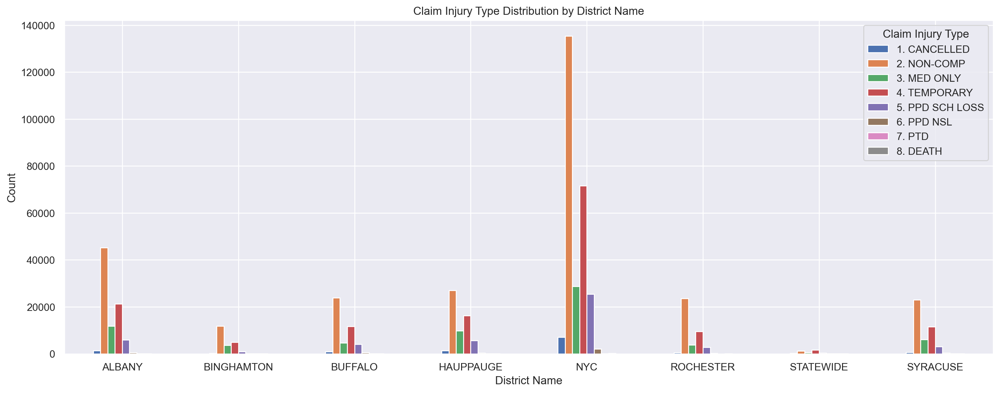

In [143]:
counts = df.groupby(['District Name', 'Claim Injury Type',]).size().unstack(fill_value=0)

counts.plot(kind='bar', stacked=False, figsize=(15, 6))

plt.title('Claim Injury Type Distribution by District Name')
plt.xlabel('District Name')
plt.ylabel('Count')
plt.xticks(rotation=0) 

plt.tight_layout()
plt.show()

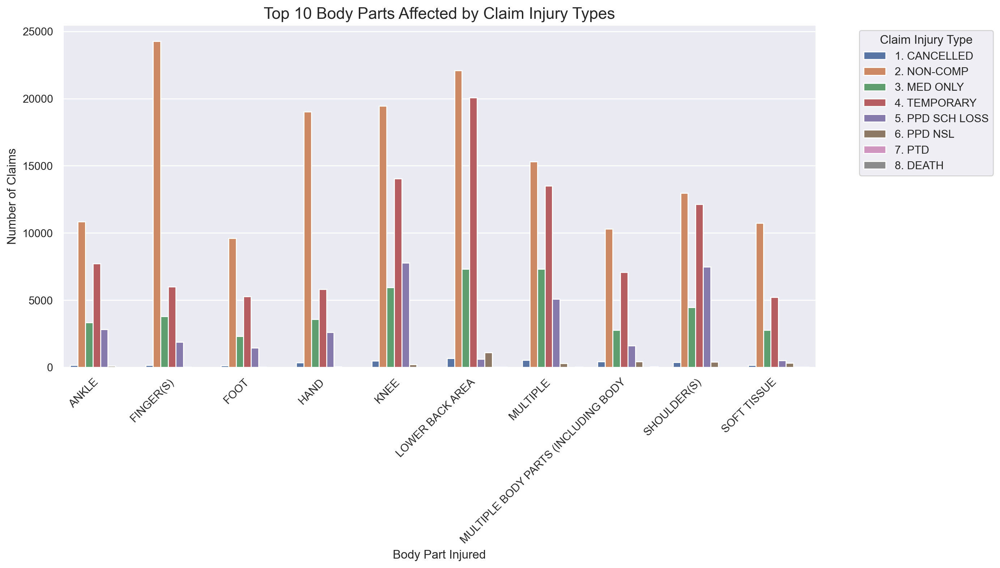

In [144]:
# Group by Part of Body and Claim Injury Type
body_part_claims = df.groupby(['WCIO Part Of Body Description', 'Claim Injury Type']).size().reset_index(name='Count')

# Plot the top 10 body parts affected
top_body_parts = body_part_claims.groupby('WCIO Part Of Body Description')['Count'].sum().nlargest(10).index
filtered_body_part_claims = body_part_claims[body_part_claims['WCIO Part Of Body Description'].isin(top_body_parts)]

plt.figure(figsize=(14, 8))
sns.barplot(data=filtered_body_part_claims, x='WCIO Part Of Body Description', y='Count', hue='Claim Injury Type')
plt.title('Top 10 Body Parts Affected by Claim Injury Types', fontsize=16)
plt.xlabel('Body Part Injured', fontsize=12)
plt.ylabel('Number of Claims', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

__Body Parts Affected by Claim Injury Types__

- **Most Common Injuries**:
  - **Lower Back Area** and **Fingers** have the highest number of claims, particularly dominated by **Non-Compensable (NON-COMP)** and **Temporary** claims.
  
- **Frequent Injury Types**:
  - **Knee** and **Shoulders** are also commonly injured, with many claims classified as **Temporary** and **Medical Only**.

- **Key Observations**:
  - **Non-Compensable (NON-COMP)** claims are prevalent across all body parts.
  - **Temporary Injuries** are prominent in the **Lower Back Area** and **Multiple Body Parts**.
  
**Insights for Classification Model**:
- **Body Parts** can be a significant feature for predicting **Claim Injury Type**.
- Focus on differentiating claims based on injuries to **Lower Back Area**, **Knee**, and **Shoulders** for better model accuracy.


<Figure size 1200x800 with 0 Axes>

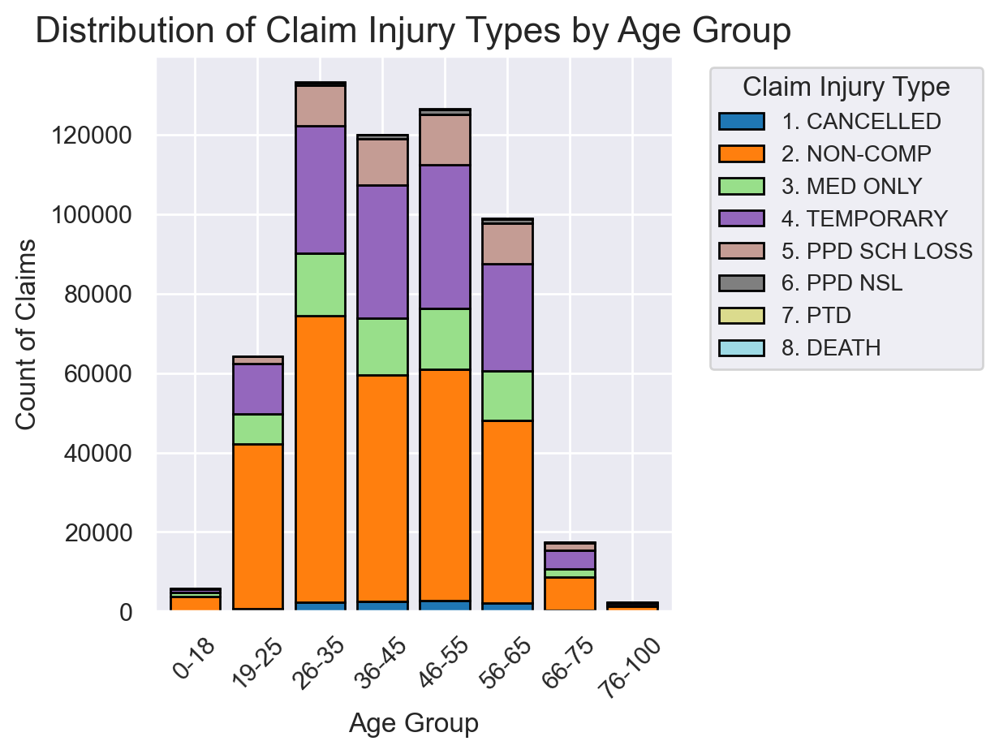

In [146]:
bins_target = [0, 18, 25, 35, 45, 55, 65, 75, 100]
labels_target = ['0-18', '19-25', '26-35', '36-45', '46-55', '56-65', '66-75', '76-100']

age_groups = pd.cut(df['Age at Injury'], bins=bins_target, labels=labels_target, right=True)

age_claim_crosstab = pd.crosstab(age_groups, df['Claim Injury Type'])

plt.figure(figsize=(12, 8))
age_claim_crosstab.plot(kind='bar', stacked=True, colormap='tab20', edgecolor='black', width=0.8)

plt.title('Distribution of Claim Injury Types by Age Group', fontsize=16)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Count of Claims', fontsize=12)
plt.xticks(rotation=45, fontsize=11)
plt.legend(title='Claim Injury Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)


plt.tight_layout()
plt.show()

__Distribution of Claim Injury Types by Age Group__

- **Non-Compensable Claims (NON-COMP)** dominate across all age groups, particularly in the **26-55** range.
- **Temporary Injuries (TEMPORARY)** are prominent in the **19-45** age groups, indicating higher rates of recoverable injuries among younger workers.
- **Medical Only (MED ONLY)** claims are consistently present in the **26-55** range.
- **Permanent Partial Disability - Scheduled Loss (PPD SCH LOSS)** is more frequent in the **46-55** age group.
- Minimal claims in the **0-18** and **76-100** age groups suggest these groups are less involved in workplace injuries or are anomalies.

These insights highlight age-specific injury patterns, useful for **targeted safety measures** and **policy adjustments**.

#### Heatmaps
Using heatmaps, we analyzed the categorical features with a higher number of distinct values, as bar charts would not have provided sufficient clarity. The analyzed features included:
- Accident per month
- Accident per days of the week

Additionally, we combined certain features to study their relationship with the target variable, including:
- Age and Industry Code description
- Average weekly Wage and Industry code


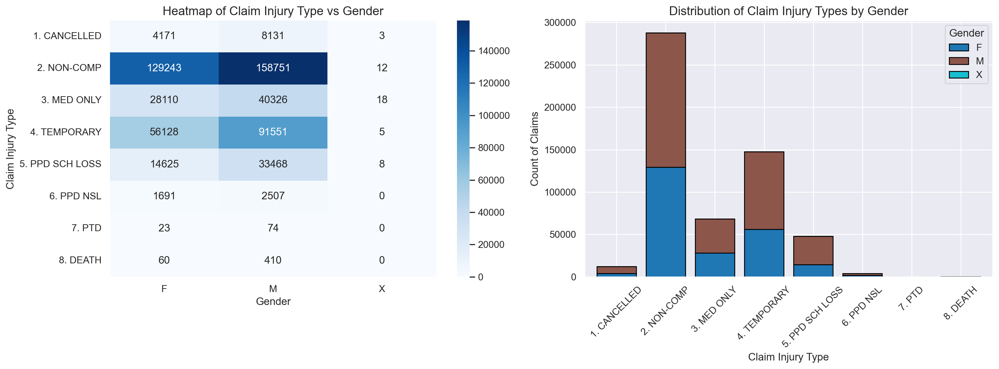

In [150]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

cross_tab = pd.crosstab(df["Claim Injury Type"], df["Gender"])
sns.heatmap(cross_tab, annot=True, fmt="d", cmap="Blues", ax=axes[0])
axes[0].set_title("Heatmap of Claim Injury Type vs Gender", fontsize=14)
axes[0].set_xlabel('Gender', fontsize=12)
axes[0].set_ylabel('Claim Injury Type', fontsize=12)

claim_by_gender = pd.crosstab(df['Claim Injury Type'], df['Gender'])

claim_by_gender.plot(
    kind='bar', stacked=True, colormap='tab10', edgecolor='black', width=0.8, ax=axes[1]
)

axes[1].set_title('Distribution of Claim Injury Types by Gender', fontsize=14)
axes[1].set_xlabel('Claim Injury Type', fontsize=12)
axes[1].set_ylabel('Count of Claims', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


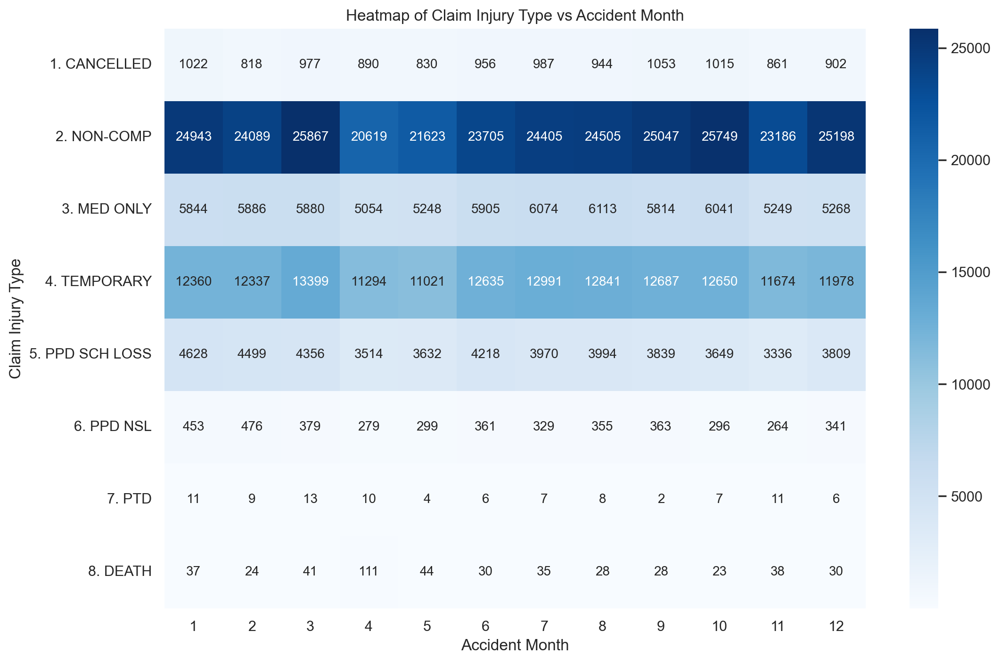

In [151]:
plt.figure(figsize=(12, 8)) 

cross_tab = pd.crosstab(
    df["Claim Injury Type"], 
    pd.to_datetime(df["Accident Date"]).dt.month
)

sns.heatmap(cross_tab, annot=True, fmt="d", cmap="Blues", xticklabels=range(1, 13), 
            annot_kws={"size": 10}) 

plt.title("Heatmap of Claim Injury Type vs Accident Month")
plt.xlabel("Accident Month")
plt.ylabel("Claim Injury Type")
plt.show()

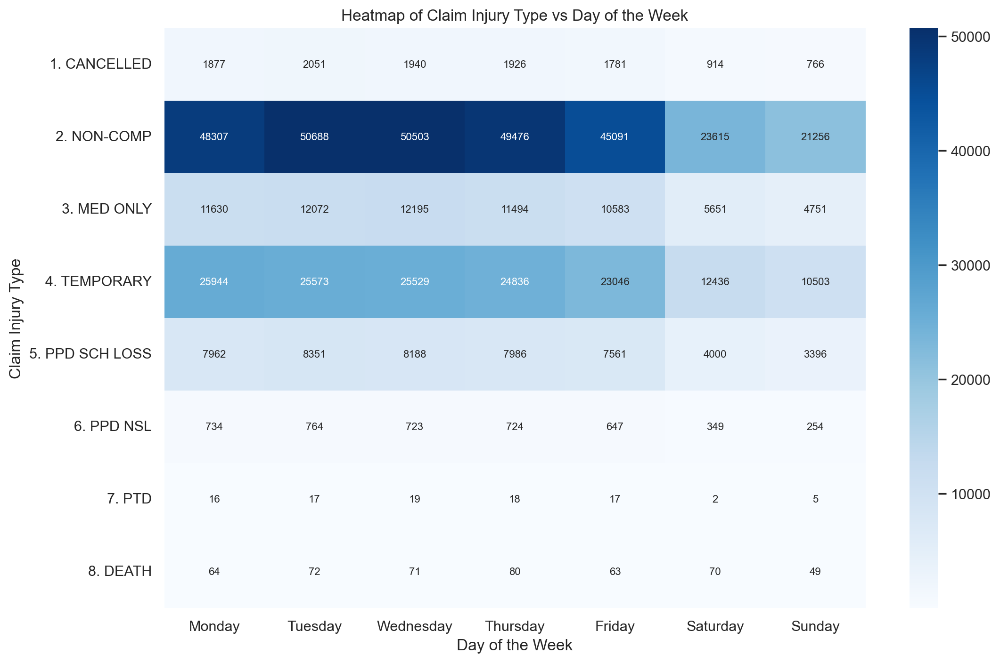

In [152]:
plt.figure(figsize=(12, 8))  

cross_tab = pd.crosstab(
    df["Claim Injury Type"], 
    pd.to_datetime(df["Accident Date"]).dt.dayofweek
)

sns.heatmap(cross_tab, annot=True, fmt="d", cmap="Blues", 
            xticklabels=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"], 
            annot_kws={"size": 8})  

plt.title("Heatmap of Claim Injury Type vs Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Claim Injury Type")
plt.show()

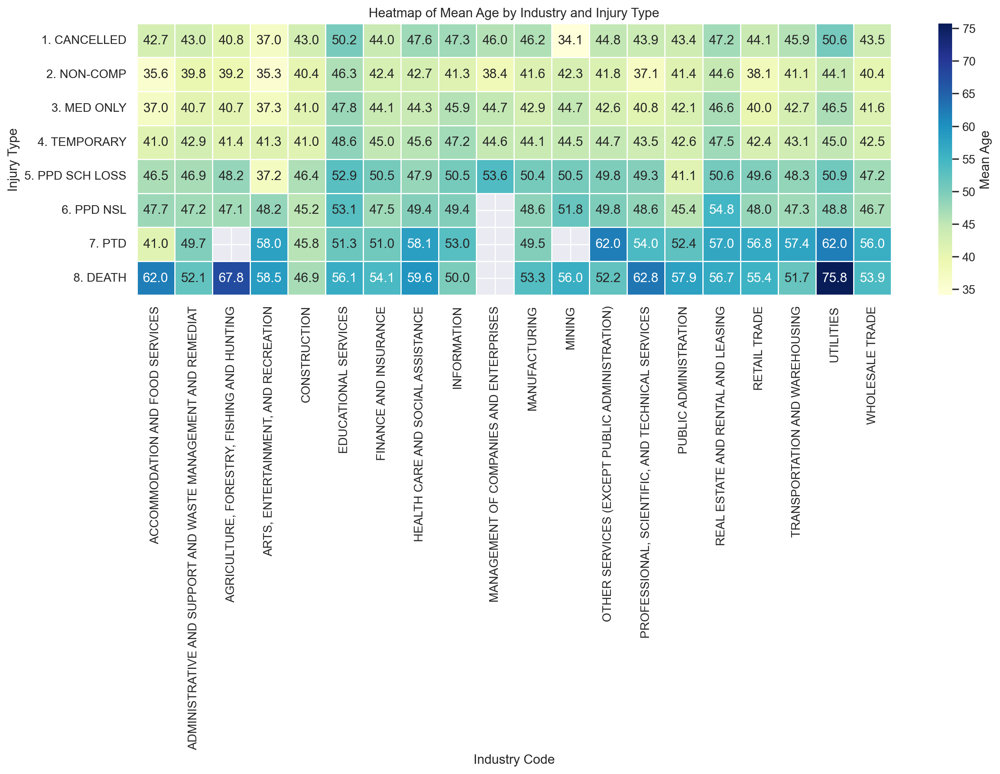

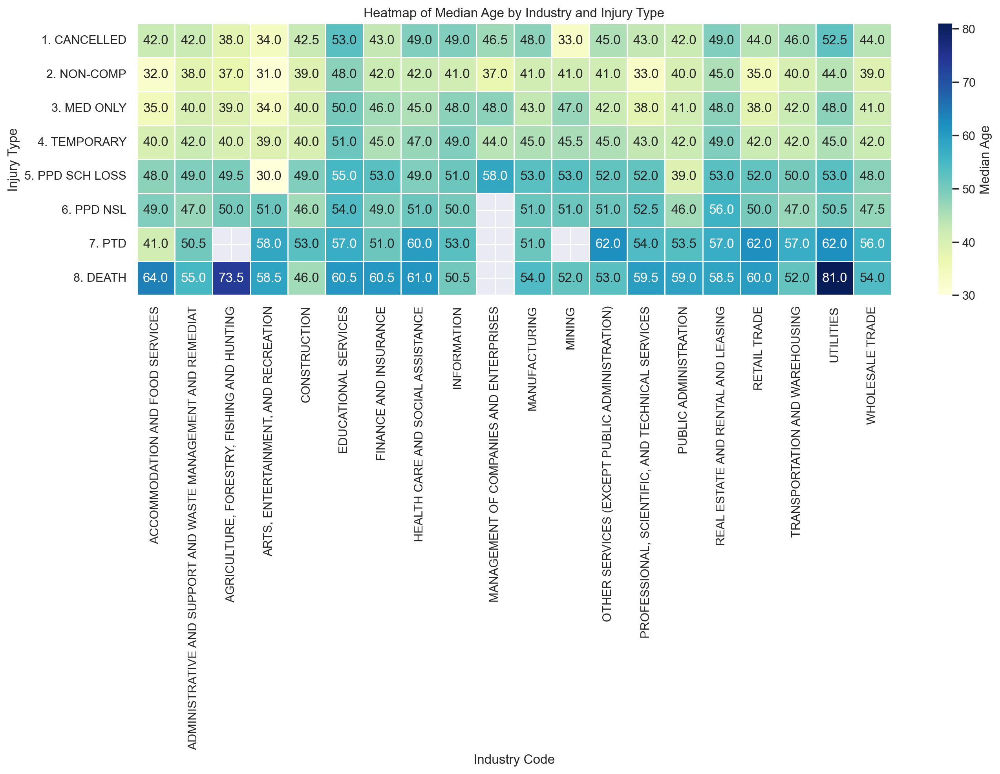

In [153]:
# Calculate the mean and median of "Age" for each combination of "Industry Code" and "Claim Injury Type"
age_stats = df.groupby(['Industry Code Description', 'Claim Injury Type'])['Age at Injury'].agg(['mean', 'median']).reset_index()

# Pivot the table for both mean and median of "Age"
age_mean = age_stats.pivot_table(index="Claim Injury Type", columns="Industry Code Description", values="mean")
age_median = age_stats.pivot_table(index="Claim Injury Type", columns="Industry Code Description", values="median")

plt.figure(figsize=(14, 10)) 

sns.heatmap(age_mean, annot=True, fmt=".1f", cmap="YlGnBu", cbar_kws={"label": "Mean Age"}, linewidths=0.5)

plt.title("Heatmap of Mean Age by Industry and Injury Type")
plt.xlabel("Industry Code")
plt.ylabel("Injury Type")
plt.tight_layout()

plt.show()

plt.figure(figsize=(14, 10)) 
sns.heatmap(age_median, annot=True, fmt=".1f", cmap="YlGnBu", cbar_kws={"label": "Median Age"}, linewidths=0.5)

plt.title("Heatmap of Median Age by Industry and Injury Type")
plt.xlabel("Industry Code")
plt.ylabel("Injury Type")
plt.tight_layout()

plt.show()

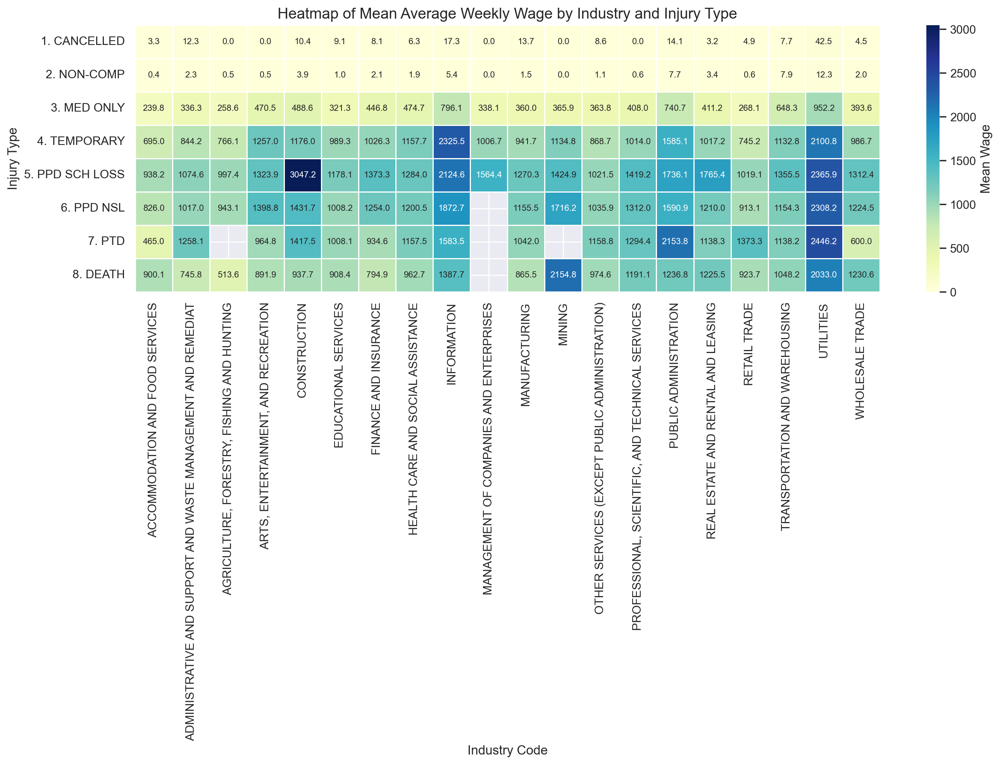

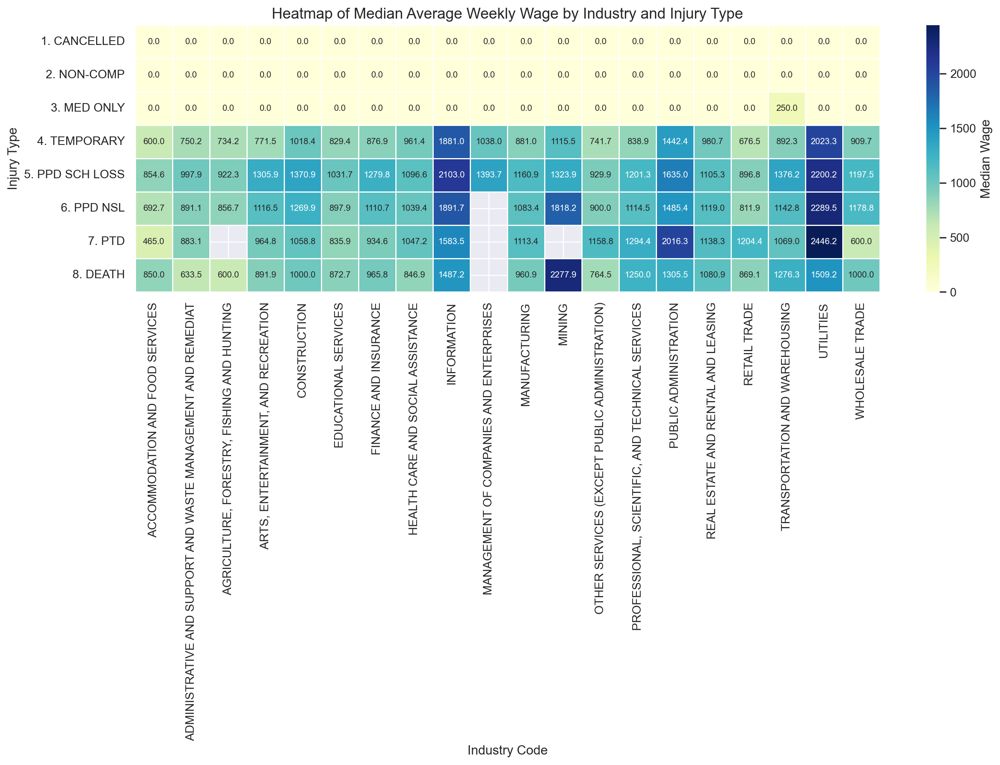

In [154]:
# Calculate the mean and median of "Average Weekly Wage" for each combination of "Industry Code" and "Claim Injury Type"
wage_stats = df.groupby(['Industry Code Description', 'Claim Injury Type'])['Average Weekly Wage'].agg(['mean', 'median']).reset_index()

# Pivot the table for both mean and median of "Average Weekly Wage"
wage_mean = wage_stats.pivot_table(index="Claim Injury Type", columns="Industry Code Description", values="mean")
wage_median = wage_stats.pivot_table(index="Claim Injury Type", columns="Industry Code Description", values="median")

plt.figure(figsize=(14, 10)) 

sns.heatmap(
    wage_mean, annot=True, fmt=".1f", cmap="YlGnBu", cbar_kws={"label": "Mean Wage"}, linewidths=0.5,
    annot_kws={"size": 8}  
)

plt.title("Heatmap of Mean Average Weekly Wage by Industry and Injury Type", fontsize=14)
plt.xlabel("Industry Code", fontsize=12)
plt.ylabel("Injury Type", fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()

plt.show()

plt.figure(figsize=(14, 10)) 
sns.heatmap(
    wage_median, annot=True, fmt=".1f", cmap="YlGnBu", cbar_kws={"label": "Median Wage"}, linewidths=0.5,
    annot_kws={"size": 8}  
)

plt.title("Heatmap of Median Average Weekly Wage by Industry and Injury Type", fontsize=14)
plt.xlabel("Industry Code", fontsize=12)
plt.ylabel("Injury Type", fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.tight_layout()

plt.show()